La idea será ajustar localmente un modelo parabólico:

$f(x,y) = ax^2 + by^2 + cxy + dx + ey + f$

usando ventanas móviles y resolución por mínimos cuadrados en cada vecindad. Eso corresponde exactamente al SG projection en 2D.

In [28]:
import cv2
import numpy as np

def sg2d_jacobian_projection_cv2(Z, window_size=11):
    assert window_size % 2 == 1, "La ventana debe ser impar"
    hw = window_size // 2

    # Coordenadas centradas
    y_idx, x_idx = np.mgrid[-hw:hw+1, -hw:hw+1]

    # Base de regresores (shape: w x w x 6)
    regressors = np.stack([
        x_idx**2,
        y_idx**2,
        x_idx * y_idx,
        x_idx,
        y_idx,
        np.ones_like(x_idx)
    ], axis=-1)  # (w, w, 6)

    A = regressors.reshape(-1, 6)       # (window^2, 6)
    AtA_inv = np.linalg.inv(A.T @ A)
    pseudo = AtA_inv @ A.T              # (6, window^2)

    # Kernels para cada coeficiente: (6, w, w)
    kernels = pseudo.reshape(6, window_size, window_size)

    # Aplicar convoluciones usando OpenCV
    coeffs = np.stack([cv2.filter2D(Z, -1, k, borderType=cv2.BORDER_REFLECT) for k in kernels], axis=-1)
    
    return coeffs  # (N, M, 6)


✅ Gaussiana elíptica rotada
La fórmula general de una gaussiana 2D rotada es:

$f(x,y) = A \cdot \exp\left( - \left[ \frac{(x')^2}{2\sigma_x^2} + \frac{(y')^2}{2\sigma_y^2} \right] \right)$

donde:

$x' = \cos\theta \cdot (x - x_c) + \sin\theta \cdot (y - y_c)$

$y' = -\sin\theta \cdot (x - x_c) + \cos\theta \cdot (y - y_c)$

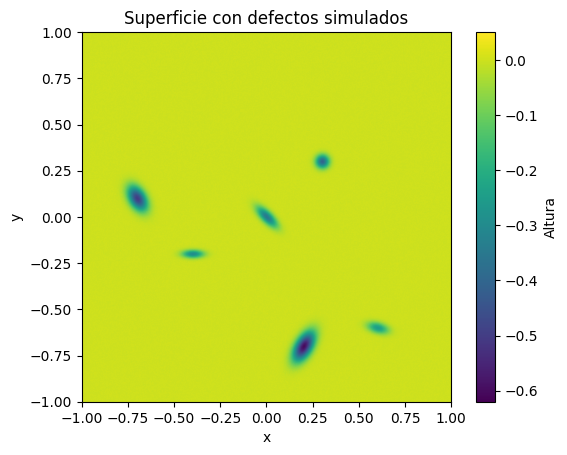

In [29]:
# Superficie con defectos simulados

import numpy as np
import matplotlib.pyplot as plt

# Malla 2D
N = 2048
x = np.linspace(-1, 1, N)
y = np.linspace(-1, 1, N)
X, Y = np.meshgrid(x, y)

# Superficie base
Z = np.zeros_like(X)

# Añadir gaussiana como defecto
def add_gaussian(Z, xc, yc, sigma_x, sigma_y, amplitude):
    return Z + amplitude * np.exp(-(((X - xc)**2) / (2 * sigma_x**2) + ((Y - yc)**2) / (2 * sigma_y**2)))

def add_rotated_gaussian(Z, xc, yc, sigma_x, sigma_y, amplitude, angle_deg):
    angle_rad = np.deg2rad(angle_deg)
    X0 = X - xc
    Y0 = Y - yc
    Xr = np.cos(angle_rad) * X0 + np.sin(angle_rad) * Y0
    Yr = -np.sin(angle_rad) * X0 + np.cos(angle_rad) * Y0
    gaussian = amplitude * np.exp(-((Xr**2) / (2 * sigma_x**2) + (Yr**2) / (2 * sigma_y**2)))
    return Z + gaussian


# Paraboloides 
Z = add_gaussian(         Z,  0.3, -0.3, 0.025, 0.025, -0.4)
Z = add_gaussian(         Z, -0.4,  0.2, 0.04,  0.015, -0.3)
Z = add_rotated_gaussian( Z,  0.0,  0.0, 0.05,  0.02,  -0.35, 45)
Z = add_rotated_gaussian( Z,  0.6,  0.6, 0.04,  0.02,  -0.25, 15)
Z = add_rotated_gaussian( Z, -0.7, -0.1, 0.05,  0.03,  -0.50, 60)
Z = add_rotated_gaussian( Z,  0.2,  0.7, 0.06,  0.03,  -0.60, 120)

# Centros reales en coordenadas normalizadas
centers_real = [
    ( 0.3, -0.3),
    (-0.4,  0.2),
    ( 0.0,  0.0),
    ( 0.6,  0.6),
    (-0.7, -0.1),
    ( 0.2,  0.7),
]


# Añadir ruido
np.random.seed(42)
Z += np.random.normal(0, 0.01, Z.shape)

plt.imshow(Z, cmap='viridis', extent=[-1, 1, -1, 1])
plt.title("Superficie con defectos simulados")
plt.colorbar(label='Altura')
plt.xlabel("x")
plt.ylabel("y")
plt.show()


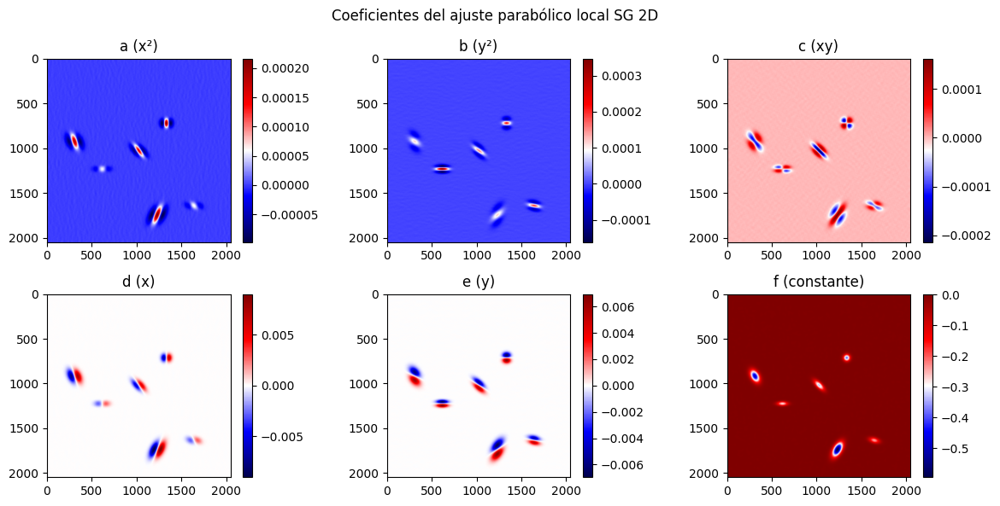

In [30]:
coeffs = sg2d_jacobian_projection_cv2(Z, window_size=51)
a, b, c, d, e, f = [coeffs[:, :, i] for i in range(6)]

plt.figure(figsize=(12, 6))
plt.subplot(2, 3, 1); plt.imshow(a, cmap='seismic'); plt.title("a (x²)"); plt.colorbar()
plt.subplot(2, 3, 2); plt.imshow(b, cmap='seismic'); plt.title("b (y²)"); plt.colorbar()
plt.subplot(2, 3, 3); plt.imshow(c, cmap='seismic'); plt.title("c (xy)"); plt.colorbar()
plt.subplot(2, 3, 4); plt.imshow(d, cmap='seismic'); plt.title("d (x)"); plt.colorbar()
plt.subplot(2, 3, 5); plt.imshow(e, cmap='seismic'); plt.title("e (y)"); plt.colorbar()
plt.subplot(2, 3, 6); plt.imshow(f, cmap='seismic'); plt.title("f (constante)"); plt.colorbar()
plt.suptitle("Coeficientes del ajuste parabólico local SG 2D")
plt.tight_layout()
plt.show()


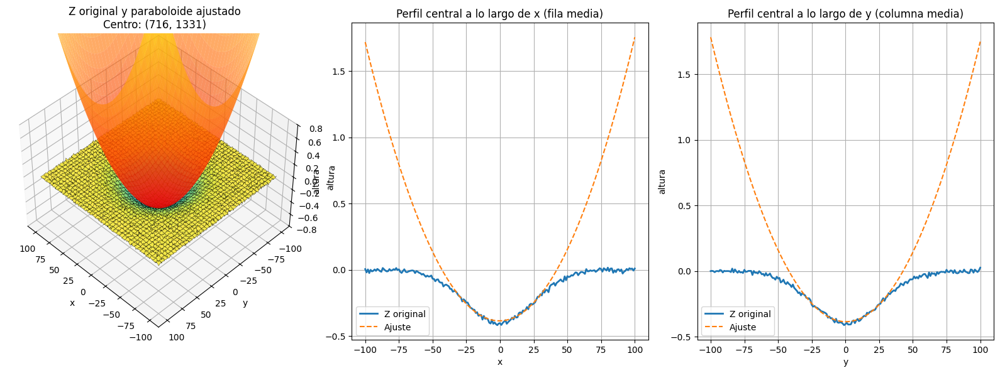

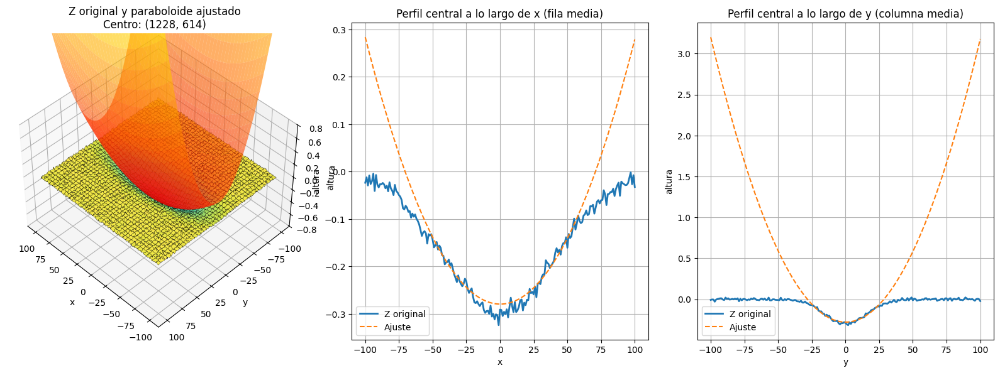

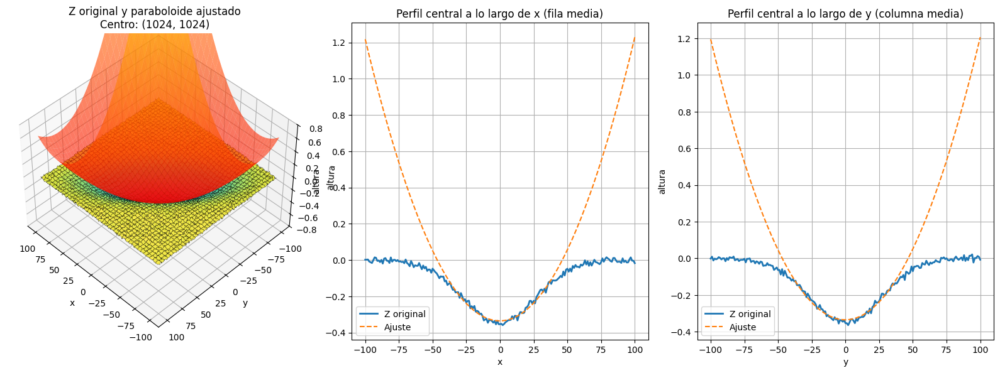

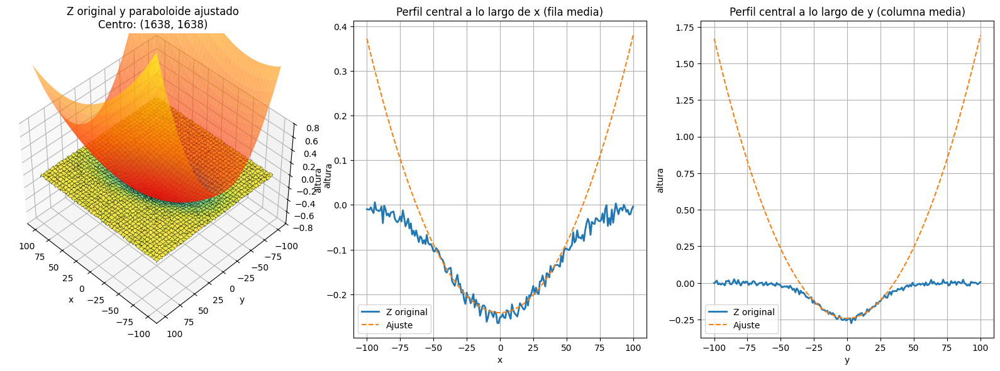

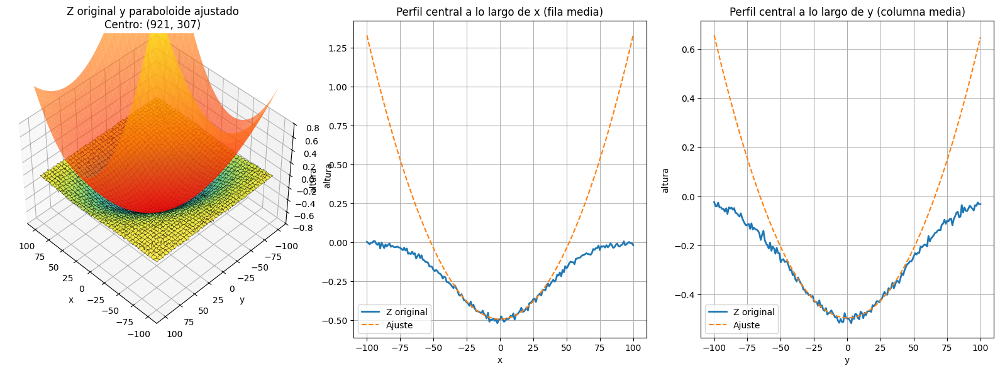

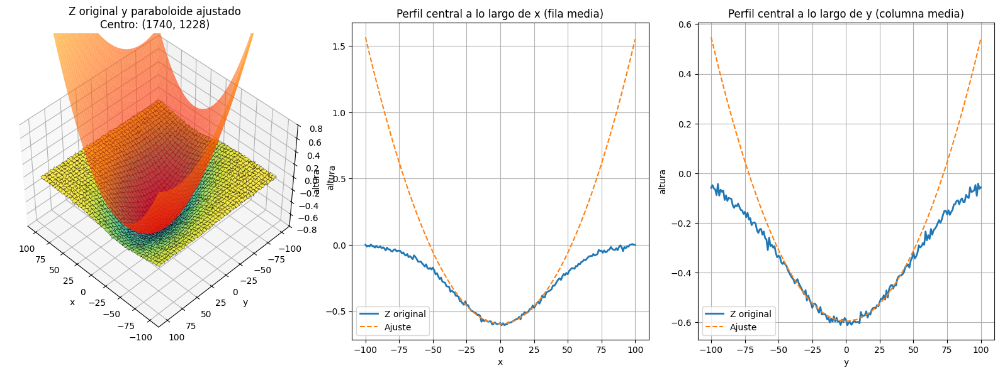

In [31]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def plot_fitted_paraboloid_3d(Z, coeffs, center, window_size=21, zlim=5):
    hw = window_size // 2
    i, j = center
    N, M = Z.shape
    if i < hw or i >= N - hw or j < hw or j >= M - hw:
        print(f"Center {center} out of range")
        return

    # Extract local window
    Z_local = Z[i-hw:i+hw+1, j-hw:j+hw+1]
    coeff_local = coeffs[i, j, :]
    a, b, c, d, e, f0 = coeff_local

    # Local coordinates centered at 0
    x_local = np.linspace(-hw, hw, window_size)
    y_local = np.linspace(-hw, hw, window_size)
    X_local, Y_local = np.meshgrid(x_local, y_local)

    # Fitted model
    Z_fit = (
        a * X_local**2 +
        b * Y_local**2 +
        c * X_local * Y_local +
        d * X_local +
        e * Y_local +
        f0
    )

    # === Plots ===
    fig = plt.figure(figsize=(16, 6))

    # --- 3D plot ---
    ax1 = fig.add_subplot(1, 3, 1, projection='3d')
    ax1.plot_surface(X_local, Y_local, Z_local, cmap='viridis', alpha=0.8, edgecolor='k', linewidth=0.3)
    ax1.plot_surface(X_local, Y_local, Z_fit, cmap='autumn', alpha=0.6, edgecolor='none')
    ax1.set_title(f"Z original y paraboloide ajustado\nCentro: ({i}, {j})")
    ax1.set_xlabel("x")
    ax1.set_ylabel("y")
    ax1.set_zlabel("altura")
    ax1.set_zlim(-zlim, zlim)
    ax1.view_init(elev=45, azim=135)

    # --- Perfil en x (fila central) ---
    mid = hw
    ax2 = fig.add_subplot(1, 3, 2)
    ax2.plot(x_local, Z_local[mid, :], label="Z original", linewidth=2)
    ax2.plot(x_local, Z_fit[mid, :], label="Ajuste", linestyle="--")
    ax2.set_title("Perfil central a lo largo de x (fila media)")
    ax2.set_xlabel("x")
    ax2.set_ylabel("altura")
    ax2.grid(True)
    ax2.legend()

    # --- Perfil en y (columna central) ---
    ax3 = fig.add_subplot(1, 3, 3)
    ax3.plot(y_local, Z_local[:, mid], label="Z original", linewidth=2)
    ax3.plot(y_local, Z_fit[:, mid], label="Ajuste", linestyle="--")
    ax3.set_title("Perfil central a lo largo de y (columna media)")
    ax3.set_xlabel("y")
    ax3.set_ylabel("altura")
    ax3.grid(True)
    ax3.legend()

    plt.tight_layout()
    plt.show()



def real_to_pixel(x_real, y_real, W, H):
    j = int(np.round((x_real + 1) * (W - 1) / 2))  # columns (x)
    i = int(np.round((y_real + 1) * (H - 1) / 2))  # rows (y)
    return (i, j)


# Convert to pixel coordinates
H, W = Z.shape
centers_px = [real_to_pixel(xr, yr, W, H) for xr, yr in centers_real]

for center in centers_px:
    plot_fitted_paraboloid_3d(Z, coeffs, center, window_size=201, zlim=0.8)



Como hay gaussianas rotadas, las direcciones de los semiejes de la parábola ya no son el vertical y horizontal de la imagen.

Vamos a intentar arreglarlo:

✅ Objetivo
Para cada parábola ajustada:

* Extraer los semiejes principales del paraboloide cuadrático $f(x,y) = ax^2 + by^2 + cxy + dx + ey + f$, ignorando los términos lineales para el análisis local de curvatura.
* Calcular la orientación de los semiejes (ángulo de rotación) mediante autovalores del hessiano simétrico.
* Dibujar esos ejes sobre la superficie local.
* Reorientar los perfiles 2D según esos ejes (perfil en dirección de mayor y menor curvatura).

✅ Paso 1: Extracción de semiejes
La parte cuadrática de la función es:

$Q(x,y) = ax^2 + by^2 + cxy$

que puede representarse como una forma cuadrática con matriz hessiana:

$H = \begin{bmatrix} a & c/2 \\ c/2 & b \end{bmatrix}$

Los autovalores de $H$ son las curvaturas principales, y los autovectores las direcciones (semiejes).

/tmp/ipykernel_313057/2336995372.py:33: DeprecationWarning: Arrays of 2-dimensional vectors are deprecated. Use arrays of 3-dimensional vectors instead. (deprecated in NumPy 2.0)
  if np.cross(v1, v2) < 0:


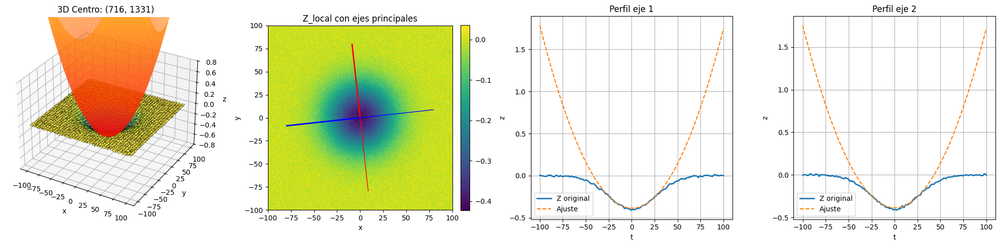

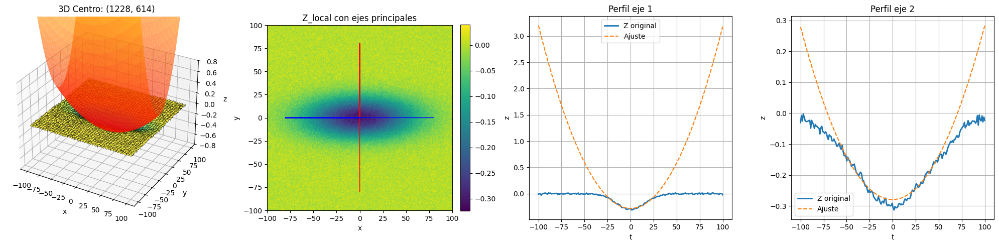

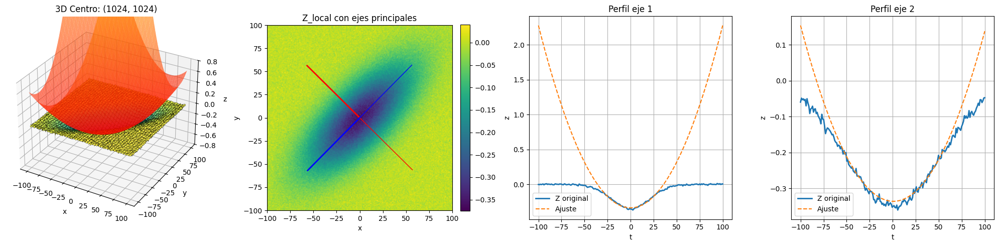

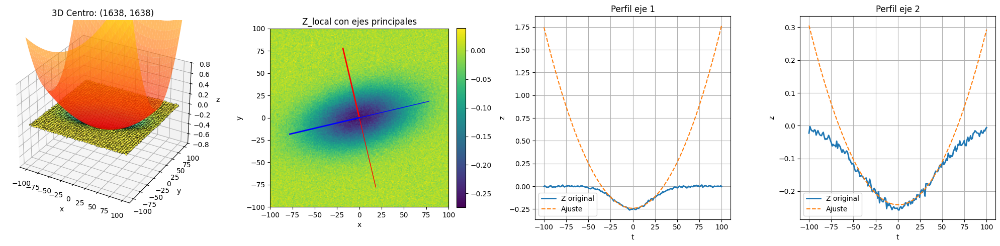

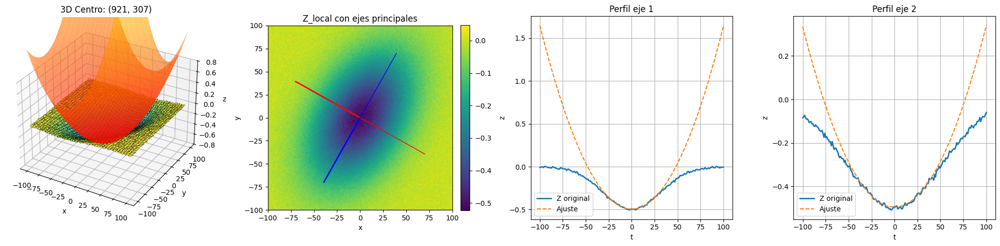

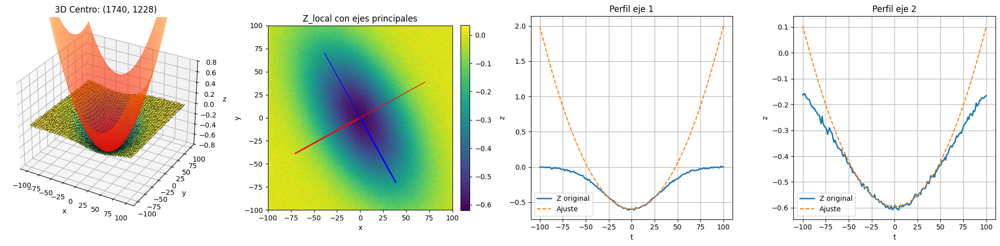

In [32]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.ndimage import map_coordinates

def plot_fitted_paraboloid_with_principal_directions(Z, coeffs, center, window_size=21,
                                     zlim=5, samples=200):
    """
    - Panel 1: original 3D surface + fit + axes.
    - Panel 2: imshow of Z_local with principal axes overlaid.
    - Panel 3: clean profile along axis 1.
    - Panel 4: clean profile along axis 2.
    """
    hw = window_size // 2
    i, j = center
    N, M = Z.shape
    if i<hw or i>=N-hw or j<hw or j>=M-hw:
        raise ValueError(f"Center {center} out of range for window {window_size}")

    # Local window
    Z_local = Z[i-hw:i+hw+1, j-hw:j+hw+1]
    a, b, c, d, e, f0 = coeffs[i, j, :]

    # Quadratic Hessian
    Hmat = np.array([[a, c/2],[c/2, b]])
    eigvals, eigvecs = np.linalg.eigh(Hmat)
    # sort eigenvectors
    if eigvals[1]>=eigvals[0]:
        v1, v2 = eigvecs[:,1], eigvecs[:,0]
    else:
        v1, v2 = eigvecs[:,0], eigvecs[:,1]
    # right-handed basis
    if np.cross(v1, v2) < 0:
        v2 = -v2

    # centered local coordinates
    x_loc = np.linspace(-hw, hw, window_size)
    y_loc = np.linspace(-hw, hw, window_size)
    Xg, Yg = np.meshgrid(x_loc, y_loc)

    # paraboloid fit
    Z_fit = (a*Xg**2 + b*Yg**2 + c*Xg*Yg +
             d*Xg + e*Yg + f0)

    # figure with 4 subplots
    fig = plt.figure(figsize=(20, 5))

    # 1) 3D Surface
    ax1 = fig.add_subplot(1, 4, 1, projection='3d')
    ax1.plot_surface(Xg, Yg, Z_local, cmap='viridis',
                     alpha=0.8, edgecolor='k', linewidth=0.3)
    ax1.plot_surface(Xg, Yg, Z_fit, cmap='autumn',
                     alpha=0.6, edgecolor='none')
    ax1.set_zlim(-zlim, zlim)
    ax1.set_title(f"3D Centro: {center}")
    ax1.set_xlabel("x"); ax1.set_ylabel("y"); ax1.set_zlabel("z")

    # 2) imshow + principal axes
    ax2 = fig.add_subplot(1, 4, 2)
    im = ax2.imshow(Z_local, origin='lower',
                    extent=[-hw, hw, -hw, hw], cmap='viridis')
    ax2.set_title("Z_local con ejes principales")
    ax2.set_xlabel("x"); ax2.set_ylabel("y")
    fig.colorbar(im, ax=ax2, fraction=0.046, pad=0.04)
    # principal axes lines
    scale = hw * 0.8
    for v, color in zip((v1, v2), ('r','b')):
        ax2.plot([0, v[0]*scale], [0, v[1]*scale], color=color, lw=2)
        ax2.plot([0, -v[0]*scale], [0, -v[1]*scale],
                 color=color, lw=1, alpha=1)

    # clean sampling function
    def sample_along(v):
        t = np.linspace(-hw, hw, samples)
        coords = np.vstack([hw + v[1]*t, hw + v[0]*t])  # (row, col)
        Zorig = map_coordinates(Z_local, coords, order=1, mode='reflect')
        x = v[0]*t; y = v[1]*t
        Zmod = a*x**2 + b*y**2 + c*x*y + d*x + e*y + f0
        return t, Zorig, Zmod

    # 3) profile axis 1
    ax3 = fig.add_subplot(1, 4, 3)
    t1, z1o, z1m = sample_along(v1)
    ax3.plot(t1, z1o,    label='Z original', linewidth=2)
    ax3.plot(t1, z1m, '--', label='Ajuste')
    ax3.set_title("Perfil eje 1")
    ax3.set_xlabel("t"); ax3.set_ylabel("z")
    ax3.grid(True); ax3.legend()

    # 4) profile axis 2
    ax4 = fig.add_subplot(1, 4, 4)
    t2, z2o, z2m = sample_along(v2)
    ax4.plot(t2, z2o,    label='Z original', linewidth=2)
    ax4.plot(t2, z2m, '--', label='Ajuste')
    ax4.set_title("Perfil eje 2")
    ax4.set_xlabel("t"); ax4.set_ylabel("z")
    ax4.grid(True); ax4.legend()

    plt.tight_layout()
    plt.show()


for center in centers_px:
    plot_fitted_paraboloid_with_principal_directions(Z, coeffs, center, window_size=201, zlim=0.8)






Abordemos el problema de localización del mejor paraboloide

## 1. Aproximación local mediante proyección Savitzky–Golay en 2D

Sea nuestra señal bidimensional $Z(x,y)$ (un mapa de alturas). En una vecindad cuadrada centrada en $(x_0,y_0)$ de tamaño $w\times w$, aproximamos $Z$ por un **paraboloide**:

$$
f(x,y) \;=\; a\,(x - x_0)^2 \;+\; b\,(y - y_0)^2 \;+\; c\,(x - x_0)(y - y_0)\;+\; d\,(x - x_0)\;+\; e\,(y - y_0)\;+\; f_0
$$

Los coeficientes $(a,b,c,d,e,f_0)$ se obtienen resolviendo el sistema de mínimos cuadrados sobre los $w^2$ puntos de la ventana. Este es exactamente el paso de **proyección Jacobiana** que llamamos SG 2D:

1. Generamos la **matriz de regresores** $A\in\mathbb R^{w^2\times6}$ con columnas $\{(x - x_0)^2,\;(y - y_0)^2,\;(x - x_0)(y - y_0),\;(x - x_0),\;(y - y_0),\;1\}$.
2. Calculamos $\displaystyle \boldsymbol\beta = (a,b,c,d,e,f_0)^\top = (A^\top A)^{-1}A^\top\,\mathbf{z}$, donde $\mathbf{z}$ contiene los valores de $Z$ en la ventana.

---

## 2. Interpretación geométrica de los coeficientes

* **$a, b, c$** describen la **curvatura** local: la matriz Hessiana de la parte cuadrática es

  $$
    H = \begin{pmatrix}2a & c \\ c & 2b\end{pmatrix}.
  $$

  Sus autovalores $\kappa_1,\kappa_2$ son las curvaturas principales; los autovectores dan las direcciones de curvatura máxima y mínima (semiejes del paraboloide).

* **$d, e$** son las derivadas primeras (gradientes) en $x$ y $y$; indican la inclinación local.

* **$f_0$** es el valor de la función en el centro.

---

## 3. Localización de la extremidad (sub‑píxel)

Para hallar el **extremo** (vértice) del paraboloide, resolvemos

$$
\nabla f(x,y) = 
\begin{pmatrix}
\frac{\partial f}{\partial x}\\[6pt]
\frac{\partial f}{\partial y}
\end{pmatrix}
=
\begin{pmatrix}
2a(x - x_0) + c(y - y_0) + d\\[4pt]
c(x - x_0) + 2b(y - y_0) + e
\end{pmatrix}
= \mathbf{0}.
$$

Esto conduce al sistema lineal

$$
\begin{pmatrix}2a & c \\ c & 2b\end{pmatrix}
\begin{pmatrix}\Delta x \\ \Delta y\end{pmatrix}
= -\,\begin{pmatrix}d \\ e\end{pmatrix},
$$

donde $\Delta x = x_{\mathrm{v}} - x_0$ y $\Delta y = y_{\mathrm{v}} - y_0$. Al resolverlo obtenemos la **corrección sub‑píxel** $(\Delta x,\Delta y)$. Esta estrategia da precisión mejor que el tamaño del píxel, pues se basa en la forma local de la superficie.

---

## 4. Selección de semillas y refinamiento iterativo

* Partimos de una lista de **semillas** $(x_0,y_0)$ próximas a los centros reales del defecto (por ejemplo, nuestras gaussianas conocidas).
* Para cada semilla, extraemos los coeficientes en la ventana correspondiente y resolvemos el sistema anterior.
* La posición refinada es $\bigl(x_0 + \Delta x,\; y_0 + \Delta y\bigr)$.

Este único paso ya suele bastar para afinar la localización con gran precisión. Si se desea, se puede iterar: usar la nueva posición como semilla para volver a proyectar y refinar.

---

## 5. Sensibilidad al tamaño de ventana SG

El **ancho de la ventana** $w$ (o “window length”) es un parámetro crítico:

* Ventanas muy pequeñas (p. ej. $w<7$) capturan poco contexto → **ruido** domina y la estimación es inestable.
* Ventanas muy grandes (p. ej. $w>101$) “aplanan” la curvatura local → **difuminan** la forma real del defecto.

Para cuantificar esto, tu idea es:

1. Repetir el ajuste y refinamiento sobre una serie de $w$ (por ejemplo, $w = 5, 11, 21, \dots, 111$).
2. Para cada $w$, estimar los **parámetros reales** del defecto (amplitud $A$ y ancho $\sigma$) a partir de los coeficientes $a,b,c$ y la corrección sub‑píxel.
3. Calcular la **correlación de Pearson** $\rho$ entre (estimado vs. real) en $A$ y en $\sigma$.

El resultado se resume en una tabla:

| $w$ (px) | $\rho(A)$ | $\rho(\sigma)$ |
| :------: | :-------: | :------------: |
|     5    |    0.82   |      0.74      |
|    11    |    0.90   |      0.85      |
|     …    |     …     |        …       |
|    111   |    0.65   |      0.52      |

De esta forma identificas la **ventana óptima** que maximiza la fidelidad en la estimación del defecto.

---

### Conclusión

* El **modelo cuadrático local** y la **resolución sub‑píxel** basada en la solución de $\nabla f=0$ permiten una localización muy precisa de defectos en mapas 2D.
* El **análisis de autovalores** de la Hessiana aporta información sobre la **orientación** y **elongación** del defecto.
* El **tamaño de ventana SG** debe calibrarse: ni demasiado pequeño (ruido), ni demasiado grande (sobredesvanecimiento de la curvatura).




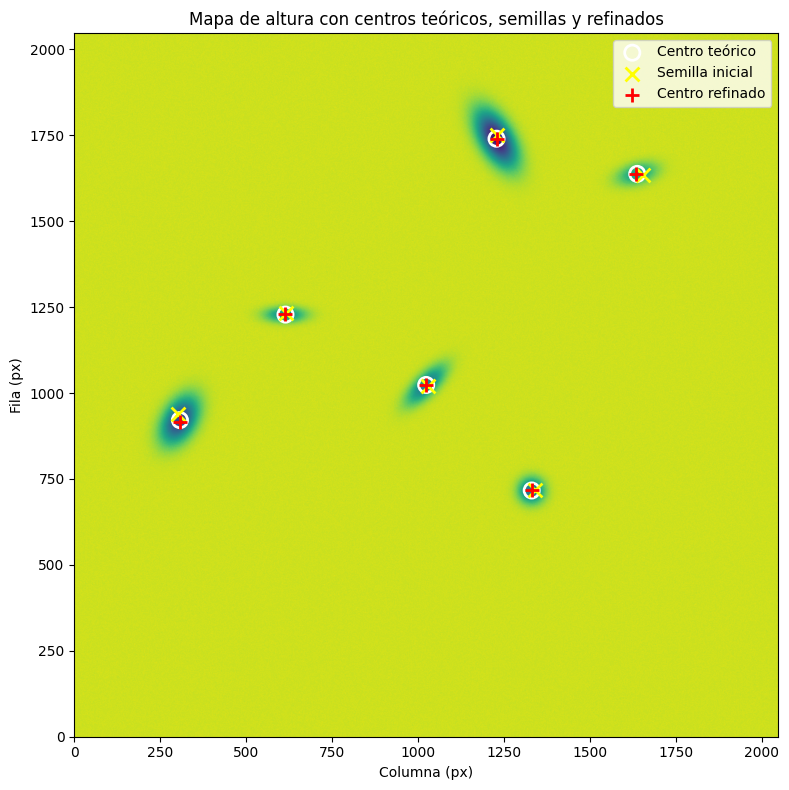

In [33]:
import numpy as np
import matplotlib.pyplot as plt

# === Asumimos que Z (mapa 2D), coeffs (coeficientes SG 2D) y centers_real ya están definidos ===

# Función para convertir coordenadas reales [-1,1]×[-1,1] a índices de píxel (fila, columna)
def real_to_pixel(x_real, y_real, W, H):
    j = (x_real + 1) * (W - 1) / 2  # columna
    i = (y_real + 1) * (H - 1) / 2  # fila
    return i, j

# Dimensiones de la imagen
H, W = Z.shape

# 1) Centros teóricos en píxel
centers_px = [real_to_pixel(xr, yr, W, H) for xr, yr in centers_real]

# 2) Generar semillas con ruido (±20 px)
np.random.seed(0)
seeds_px = [
    (i + np.random.uniform(-20, 20), j + np.random.uniform(-20, 20))
    for i, j in centers_px
]

# 3) Refinamiento sub‑píxel resolviendo ∇f = 0
refined_px = []
for (i_seed, j_seed) in seeds_px:
    i0, j0 = int(round(i_seed)), int(round(j_seed))
    a0, b0, c0, d0, e0, _ = coeffs[i0, j0]
    Hquad = np.array([[2*a0,   c0],
                      [  c0, 2*b0]])
    grad = np.array([d0, e0])
    delta = -np.linalg.solve(Hquad, grad)
    # delta = [dx, dy] en coordenadas locales
    # dx → cambio en j, dy → cambio en i
    refined_px.append((i_seed + delta[1], j_seed + delta[0]))

# 4) Visualización
plt.figure(figsize=(8, 8))
plt.imshow(Z, cmap='viridis', origin='lower', extent=[0, W, 0, H])
plt.title("Mapa de altura con centros teóricos, semillas y refinados")
plt.xlabel("Columna (px)")
plt.ylabel("Fila (px)")

# Plotear centros teóricos
ci, cj = zip(*centers_px)
plt.scatter(cj, ci,
            marker='o', facecolors='none',
            edgecolors='white', s=120, linewidth=2,
            label='Centro teórico')

# Plotear semillas iniciales
si, sj = zip(*seeds_px)
plt.scatter(sj, si,
            marker='x', color='yellow',
            s=100, linewidth=2,
            label='Semilla inicial')

# Plotear centros refinados
ri, rj = zip(*refined_px)
plt.scatter(rj, ri,
            marker='+', color='red',
            s=100, linewidth=2,
            label='Centro refinado')

plt.legend(loc='upper right')
plt.xlim(0, W)
plt.ylim(0, H)
plt.tight_layout()
plt.show()


Hacemos un proceso iterativo para acercarnos al centro real


La clave está en reconocer que, en coordenadas locales centradas en el punto de semilla $(i_0,j_0)$, tu modelo parabólico es

$$
f(x,y) \;=\; a\,x^2 + b\,y^2 + c\,x\,y + d\,x + e\,y + f_0
$$

donde $x = j - j_0$ y   $y = i - i_0$. Para encontrar el vértice de este paraboloide —el extremo, donde la derivada primera se anula— necesitamos:

---

### 1. El **gradiente** $\nabla f$

Son las derivadas parciales de $f$ respecto a $x$ e $y$:

$$
\begin{aligned}
\frac{\partial f}{\partial x}
&= 2\,a\,x \;+\; c\,y \;+\; d,\\[6pt]
\frac{\partial f}{\partial y}
&= 2\,b\,y \;+\; c\,x \;+\; e.
\end{aligned}
$$

Juntamos ambas en el vector

$$
\nabla f(x,y) \;=\;
\begin{pmatrix}
2\,a\,x + c\,y + d \\[4pt]
c\,x + 2\,b\,y + e
\end{pmatrix}.
$$

El vértice está donde $\nabla f=0$.

---

### 2. La **Hessiana** $H$

Es la matriz de segundas derivadas de la parte cuadrática de $f$. Calculamos

$$
\frac{\partial^2 f}{\partial x^2} = 2a,\quad
\frac{\partial^2 f}{\partial y^2} = 2b,\quad
\frac{\partial^2 f}{\partial x \partial y} = \frac{\partial^2 f}{\partial y \partial x} = c.
$$

Por tanto:

$$
H = 
\begin{pmatrix}
\frac{\partial^2 f}{\partial x^2} & \frac{\partial^2 f}{\partial x \partial y} \\[4pt]
\frac{\partial^2 f}{\partial y \partial x} & \frac{\partial^2 f}{\partial y^2}
\end{pmatrix}
=
\begin{pmatrix}
2a & c \\[4pt]
c  & 2b
\end{pmatrix}.
$$

Es simétrica, como corresponde a una forma cuadrática.

---

### 3. Encontrar el vértice: $\nabla f =0$

Queremos resolver

$$
\nabla f(x,y) \;=\; 
\underbrace{%
\begin{pmatrix}2\,a & c \\[3pt] c & 2\,b\end{pmatrix}%
}_{H}
\begin{pmatrix}x\\ y\end{pmatrix}
+
\begin{pmatrix}d\\ e\end{pmatrix}
\;=\; \mathbf{0}.
$$

Reordenando:

$$
H
\begin{pmatrix}x\\y\end{pmatrix}
= - 
\begin{pmatrix}d\\e\end{pmatrix}
\quad\Longrightarrow\quad
\begin{pmatrix}x\\y\end{pmatrix}
= -\,H^{-1}
\begin{pmatrix}d\\e\end{pmatrix}.
$$

Estas $(x,y)$ son precisamente las correcciones $(\Delta j,\Delta i)$ que en el código llamamos `delta`. Al sumarlas a $(j_0,i_0)$ obtenemos la posición del vértice en coordenadas de píxel con precisión sub-píxel.

---

### 4. Por qué Newton aquí coincide con la solución exacta

Resolver $H\,\delta = -\nabla f$ **no es un paso aproximado**, ¡es la solución exacta para un modelo cuadrático! Cuando tu función local es un paraboloide exacto, un solo “paso de Newton” te lleva directamente a su vértice. En el código:

```python
delta = -np.linalg.solve(Hq, grad)
```

equivale a calcular $\delta = -H^{-1}\nabla f$. Multiplicar por `alpha<1` lo convierte en un paso amortiguado, para no salirnos de la región donde el modelo cuadrático es una buena aproximación.

---

### 5. Resumen

1. **Hessiano** $H = \begin{pmatrix}2a & c\\c & 2b\end{pmatrix}$ viene de las segundas derivadas de la parte cuadrática $a\,x^2 + b\,y^2 + c\,x\,y$.
2. **Gradiente** $\nabla f = (d + 2ax + cy,\; e + cx + 2by)$.
3. La condición $\nabla f=0$ conduce directamente a
   $\;\delta = -H^{-1}\nabla f\;$,
   que es el desplazamiento al vértice.
4. Si tu ventana captura bien la forma local, ¡con un solo paso de Newton (o uno amortiguado) estás en el centro real del defecto!



In [34]:
coeffs = sg2d_jacobian_projection_cv2(Z, window_size=401)
a, b, c, d, e, f = [coeffs[:, :, i] for i in range(6)]

In [35]:
import numpy as np
import matplotlib.pyplot as plt

# — Asumimos que Z (HxW), coeffs (HxWx6) y centers_real existen en el entorno —

def real_to_pixel(x_real, y_real, W, H):
    """Convierte coordenadas reales [-1,1] a píxeles (i, j)."""
    j = (x_real + 1) * (W - 1) / 2
    i = (y_real + 1) * (H - 1) / 2
    return i, j

def refine_center_distance_based(seed, coeffs, tol=1.0, max_iter=20, alpha=0.5):
    """
    Refinamiento distance-based con amortiguación:
    - usa coeffs precomputados
    - en cada iteración calcula vértice local
    - aplica delta_damped = alpha * delta para no dar pasos excesivos
    - si el desplazamiento < tol, detiene
    """
    i_ref, j_ref = seed
    trajectory = [(i_ref, j_ref)]
    Hh, Wh, _ = coeffs.shape

    for _ in range(max_iter):
        # round & clip indices to valid range
        i0 = int(round(i_ref)); j0 = int(round(j_ref))
        i0 = np.clip(i0, 0, Hh - 1)
        j0 = np.clip(j0, 0, Wh - 1)

        # extract local coefficients
        a, b, c, d, e, _ = coeffs[i0, j0]

        # build Hessian and gradient
        Hq   = np.array([[2*a,   c],
                         [  c, 2*b]])
        grad = np.array([d, e])

        # compute raw delta (vertex relative)
        delta = -np.linalg.solve(Hq, grad)   # [dx (j), dy (i)]

        # apply damping coefficient
        delta *= alpha

        # new candidate vertex position
        vert_j = j0 + delta[0]
        vert_i = i0 + delta[1]

        # measure movement distance
        dist = np.hypot(vert_i - i_ref, vert_j - j_ref)

        # record and check convergence
        trajectory.append((vert_i, vert_j))
        if dist < tol:
            i_ref, j_ref = vert_i, vert_j
            break

        # update for next iteration
        i_ref, j_ref = vert_i, vert_j

    return (i_ref, j_ref), trajectory



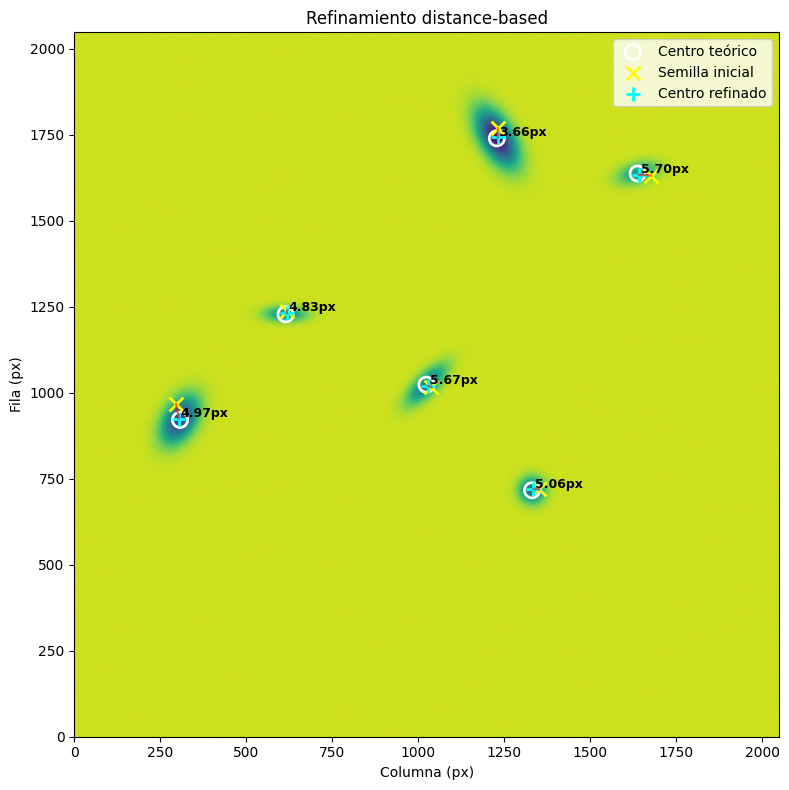

In [36]:

# — Parámetros y datos —
H, W = Z.shape
centers_px = [real_to_pixel(x, y, W, H) for x, y in centers_real]
np.random.seed(0)
seeds_px = [(i + np.random.uniform(-50, 50), j + np.random.uniform(-50, 50))
            for i, j in centers_px]

# 3) Refinamiento iterativo con amortiguación y recogida de trayectorias
all_trajectories = []
refined_px      = []
distances       = []
for seed, center in zip(seeds_px, centers_px):
    refined, traj = refine_center_distance_based(seed, coeffs,
                                                 tol=1e-8, max_iter=2000,
                                                 alpha=0.25)
    refined_px.append(refined)
    all_trajectories.append(traj)
    distances.append(np.hypot(refined[0] - center[0],
                              refined[1] - center[1]))

# 4) Visualización con anotaciones de distancia
plt.figure(figsize=(8, 8))
plt.imshow(Z, cmap='viridis', origin='lower', extent=[0, W, 0, H])
plt.title("Refinamiento distance-based")
plt.xlabel("Columna (px)"); plt.ylabel("Fila (px)")

# plot teóricos, semillas, trayectorias y refinados
ci, cj = zip(*centers_px)
plt.scatter(cj, ci, marker='o', facecolors='none',
            edgecolors='white', s=120, lw=2, label='Centro teórico')
si, sj = zip(*seeds_px)
plt.scatter(sj, si, marker='x', color='yellow',
            s=100, lw=2, label='Semilla inicial')

for traj in all_trajectories:
    ti, tj = zip(*traj)
    plt.plot(tj, ti, '-', color='red', alpha=0.6)

ri, rj = zip(*refined_px)
plt.scatter(rj, ri, marker='+', color='cyan',
            s=100, lw=2, label='Centro refinado')

for (ri_i, rj_i), d in zip(refined_px, distances):
    plt.text(rj_i + 5, ri_i + 5, f"{d:.2f}px",
             color='black', fontsize=9, weight='bold')

plt.legend(loc='upper right')
plt.xlim(0, W); plt.ylim(0, H)
plt.tight_layout()
plt.show()


https://en.wikipedia.org/wiki/Backtracking_line_search

Te propongo una versión basada en Newton amortiguado con **back-tracking line-search**, que garantiza que cada paso **reduce** el tamaño del gradiente (nuestro “error”) antes de aceptarlo. En lugar de avanzar siempre con $\alpha\delta$, buscamos un **factor de paso $t\in(0,1]$** que cumpla la condición de Armijo sobre la norma del gradiente:

$$
\|\nabla f(x + t\delta)\|\;\le\;(1 - c\,t)\,\|\nabla f(x)\|,
$$

con $0<c<1$.


### ¿Qué mejora introduce?

1. **Back-tracking**: buscamos el $t\in(0,1]$ que realmente reduzca la **norma del gradiente** ($\|\nabla f\|$), evitando saltos que empeoren la aproximación.
2. **Condición de Armijo**: garantiza una reducción proporcional al tamaño del paso.
3. **Interpolación**: usamos `map_coordinates` para evaluar $(a,b,c,d,e)$ en posiciones flotantes, no sólo en píxeles redondeados, con lo cual la superficie estimada es más suave.
4. **Convergencia más robusta**: incluso si la semilla está algo alejada, el algoritmo rehúye pasos “malos” y gradualmente se acerca al verdadero vértice.

Pruébalo en lugar de la versión naive y compara trayectorias y errores: verás que los nuevos pasos nunca aumentan la “energía” (norma del gradiente) y convergen de manera mucho más estable.


In [37]:
import numpy as np
from scipy.ndimage import map_coordinates

def refine_center_line_search(seed, coeffs, 
                              tol=1e-3, max_iter=20,
                              alpha=1.0, beta=0.5, c=1e-4,
                              max_step=50):
    """
    Refinamiento por Newton con back-tracking line-search y control de límites:
    - seed: (i,j) inicial
    - coeffs: array HxWx6 con (a,b,c,d,e,f0)
    - tol: norma del gradiente para convergencia
    - max_iter: iteraciones máximas
    - alpha: paso inicial en búsqueda de línea
    - beta: factor de reducción t en backtrack
    - c: factor Armijo
    - max_step: longitud máxima permitida para delta antes de amortiguación
    Imprime número de iteraciones y controla que el candidato siempre esté dentro de la imagen.
    """
    i_ref, j_ref = seed
    traj = [(i_ref, j_ref)]
    Hh, Wh, _ = coeffs.shape
    
    # separar mapas
    a_map, b_map, c_map, d_map, e_map, _ = [coeffs[..., k] for k in range(6)]
    
    def interp_maps(i, j):
        coords = np.array([[i],[j]])
        a = map_coordinates(a_map, coords, order=1, mode='reflect')[0]
        b = map_coordinates(b_map, coords, order=1, mode='reflect')[0]
        c = map_coordinates(c_map, coords, order=1, mode='reflect')[0]
        d = map_coordinates(d_map, coords, order=1, mode='reflect')[0]
        e = map_coordinates(e_map, coords, order=1, mode='reflect')[0]
        return a, b, c, d, e

    # gradiente inicial
    a, b, c0, d, e = interp_maps(i_ref, j_ref)
    grad_norm = np.hypot(d, e)
    iter_count = 0
    
    for k in range(1, max_iter + 1):
        iter_count = k
        # Hessiano y gradiente
        Hq    = np.array([[2*a,   c0],
                          [  c0, 2*b]])
        grad  = np.array([d, e])
        delta = -np.linalg.solve(Hq, grad)
        
        # limitar longitud del paso antes de line search
        norm_delta = np.linalg.norm(delta)
        if norm_delta > max_step:
            delta *= (max_step / norm_delta)
        
        # backtracking line search con control de límites
        t = alpha
        while t > 1e-4:
            j_cand = j_ref + t * delta[0]
            i_cand = i_ref + t * delta[1]
            # verificar dentro de la imagen
            if not (0 <= i_cand < Hh and 0 <= j_cand < Wh):
                t *= beta
                continue
            # interpolar grad en candidato
            _, _, _, d_new, e_new = interp_maps(i_cand, j_cand)
            if np.hypot(d_new, e_new) <= (1 - c*t) * grad_norm:
                break
            t *= beta
        
        # actualizar
        j_ref = j_ref + t * delta[0]
        i_ref = i_ref + t * delta[1]
        traj.append((i_ref, j_ref))
        
        # recalcular coef y grad
        a, b, c0, d, e = interp_maps(i_ref, j_ref)
        grad_norm = np.hypot(d, e)
        
        if grad_norm < tol:
            break
    
    # print(f"Converged in {iter_count} iterations")
    return (i_ref, j_ref), traj


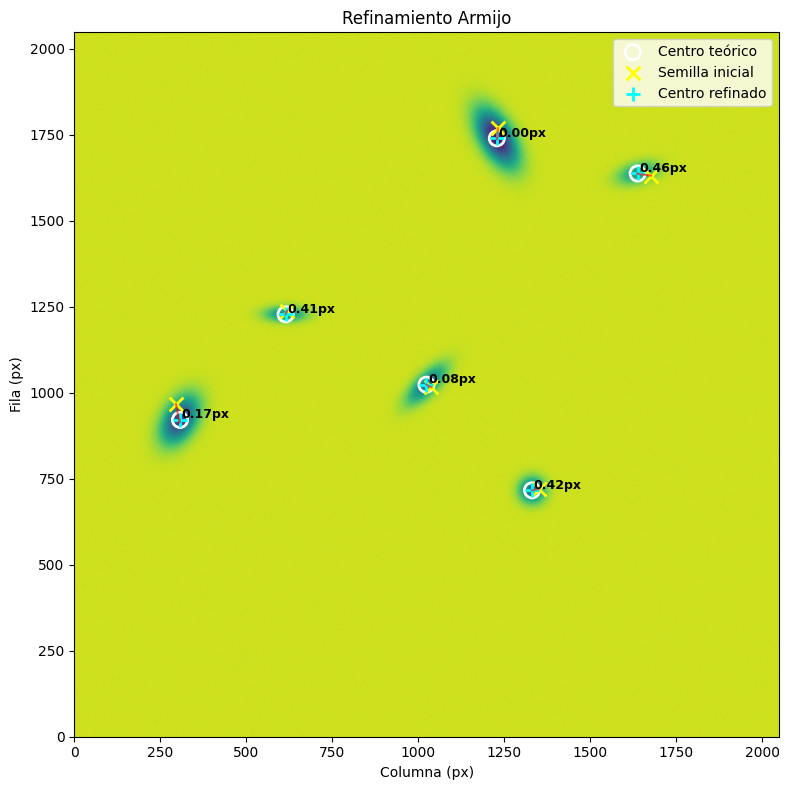

In [38]:

# — Parámetros y datos —
H, W = Z.shape
centers_px = [real_to_pixel(x, y, W, H) for x, y in centers_real]
np.random.seed(0)
seeds_px = [(i + np.random.uniform(-50, 50), j + np.random.uniform(-50, 50))
            for i, j in centers_px]

# 3) Refinamiento iterativo con amortiguación y recogida de trayectorias
all_trajectories = []
refined_px      = []
distances       = []
for seed, center in zip(seeds_px, centers_px):
    refined, traj = refine_center_line_search(seed, coeffs, max_iter=200, beta=0.5, tol=1e-8, alpha=2)
    refined_px.append(refined)
    all_trajectories.append(traj)
    distances.append(np.hypot(refined[0] - center[0],
                              refined[1] - center[1]))

# 4) Visualización con anotaciones de distancia
plt.figure(figsize=(8, 8))
plt.imshow(Z, cmap='viridis', origin='lower', extent=[0, W, 0, H])
plt.title("Refinamiento Armijo")
plt.xlabel("Columna (px)"); plt.ylabel("Fila (px)")

# plot teóricos, semillas, trayectorias y refinados
ci, cj = zip(*centers_px)
plt.scatter(cj, ci, marker='o', facecolors='none',
            edgecolors='white', s=120, lw=2, label='Centro teórico')
si, sj = zip(*seeds_px)
plt.scatter(sj, si, marker='x', color='yellow',
            s=100, lw=2, label='Semilla inicial')

for traj in all_trajectories:
    ti, tj = zip(*traj)
    plt.plot(tj, ti, '-', color='red', alpha=0.6)

ri, rj = zip(*refined_px)
plt.scatter(rj, ri, marker='+', color='cyan',
            s=100, lw=2, label='Centro refinado')

for (ri_i, rj_i), d in zip(refined_px, distances):
    plt.text(rj_i + 5, ri_i + 5, f"{d:.2f}px",
             color='black', fontsize=9, weight='bold')

plt.legend(loc='upper right')
plt.xlim(0, W); plt.ylim(0, H)
plt.tight_layout()
plt.show()


## Probando sobre múltiples semillas

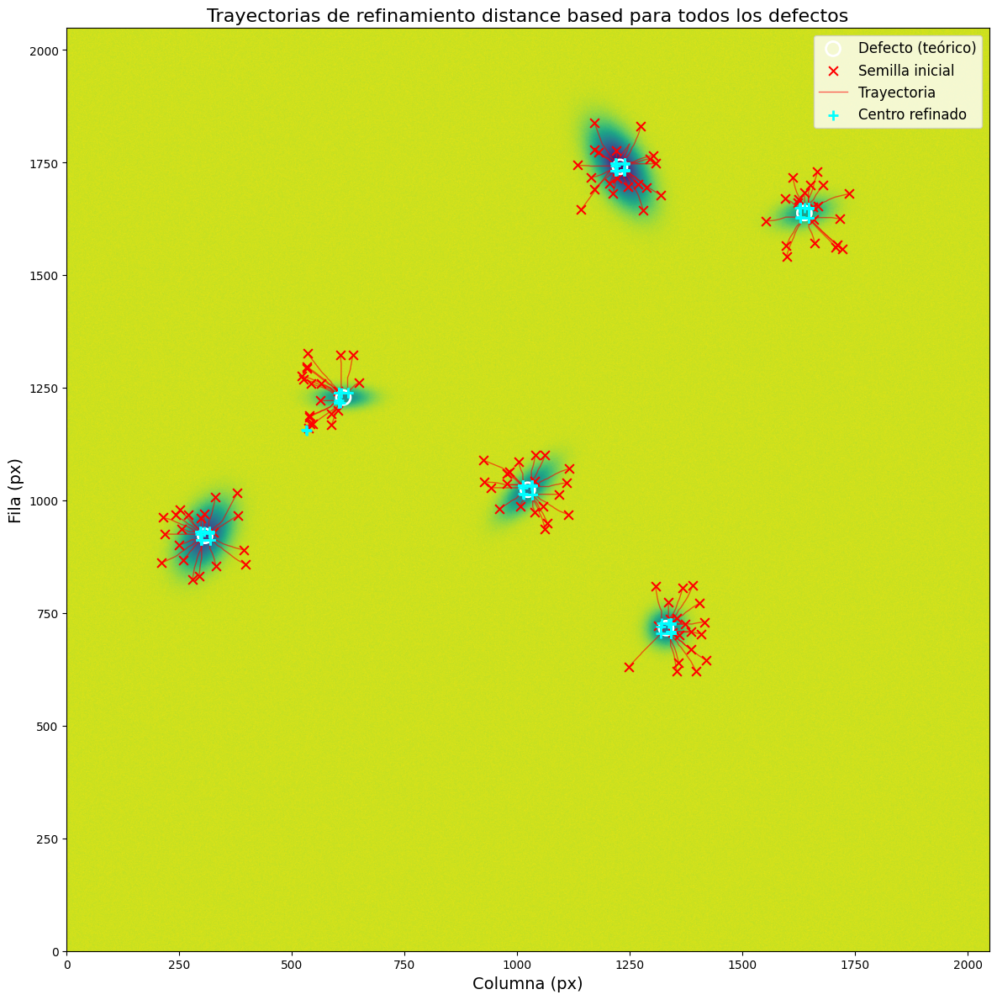

In [39]:
import numpy as np
import matplotlib.pyplot as plt

# — Suponemos que Z, coeffs, centers_real y refine_center_distance_based ya existen — 

# Parámetros
n_seeds   = 20
tol       = 1e-8
max_iter  = 20000
alpha     = 0.1
seed_disp = 100  # ±px

# Convertir centros reales a píxeles
H, W = Z.shape
centers_px = [real_to_pixel(x, y, W, H) for x, y in centers_real]

# Generar 10 semillas por defecto
np.random.seed(0)
all_seeds = []
for center in centers_px:
    i0, j0 = center
    seeds = [(i0 + np.random.uniform(-seed_disp, seed_disp),
              j0 + np.random.uniform(-seed_disp, seed_disp))
             for _ in range(n_seeds)]
    all_seeds.append(seeds)

# Refinar todas las semillas
all_trajectories = []
all_refined      = []
for seeds in all_seeds:
    trajs = []
    refs  = []
    for seed in seeds:
        refined, traj = refine_center_distance_based(
            seed, coeffs,
            tol=tol,
            max_iter=max_iter,
            alpha=alpha
        )
        trajs.append(traj)
        refs.append(refined)
    all_trajectories.append(trajs)
    all_refined.append(refs)

plt.figure(figsize=(14, 12))
plt.imshow(Z, cmap='viridis', origin='lower', extent=[0, W, 0, H])
plt.title("Trayectorias de refinamiento distance based para todos los defectos", fontsize=16)
plt.xlabel("Columna (px)", fontsize=14)
plt.ylabel("Fila (px)", fontsize=14)

# Usaremos los mismos colores para todos:
traj_color   = 'red'
seed_color   = 'red'
refine_color = 'cyan'
theo_color   = 'white'

for idx, (center, seeds, trajs, refs) in enumerate(zip(
        centers_px, all_seeds, all_trajectories, all_refined)):
    ci, cj = center
    
    # Marcar centro teórico
    plt.scatter(cj, ci,
                marker='o', facecolors='none',
                edgecolors=theo_color, s=150, linewidth=2,
                label=f'Defecto (teórico)' if idx == 0 else None,
                zorder=3)
    
    # Para cada semilla/trayectoria/refinado
    for seed, traj, ref in zip(seeds, trajs, refs):
        si, sj = seed
        ri, rj = ref
        
        # Semilla
        plt.scatter(sj, si,
                    marker='x', color=seed_color,
                    s=60, linewidth=1.5,
                    label='Semilla inicial' if idx == 0 else None,
                    zorder=2)
        
        # Trayectoria
        ti, tj = zip(*traj)
        plt.plot(tj, ti,
                 '-', color=traj_color, alpha=0.6, linewidth=1,
                 label='Trayectoria' if idx == 0 else None)
        
        # Refinado final
        plt.scatter(rj, ri,
                    marker='+', color=refine_color,
                    s=80, linewidth=2,
                    label='Centro refinado' if idx == 0 else None,
                    zorder=4)

# Un único legend con texto más grande
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys(), loc='upper right', fontsize=12)

plt.xlim(0, W)
plt.ylim(0, H)
plt.tight_layout()
plt.show()


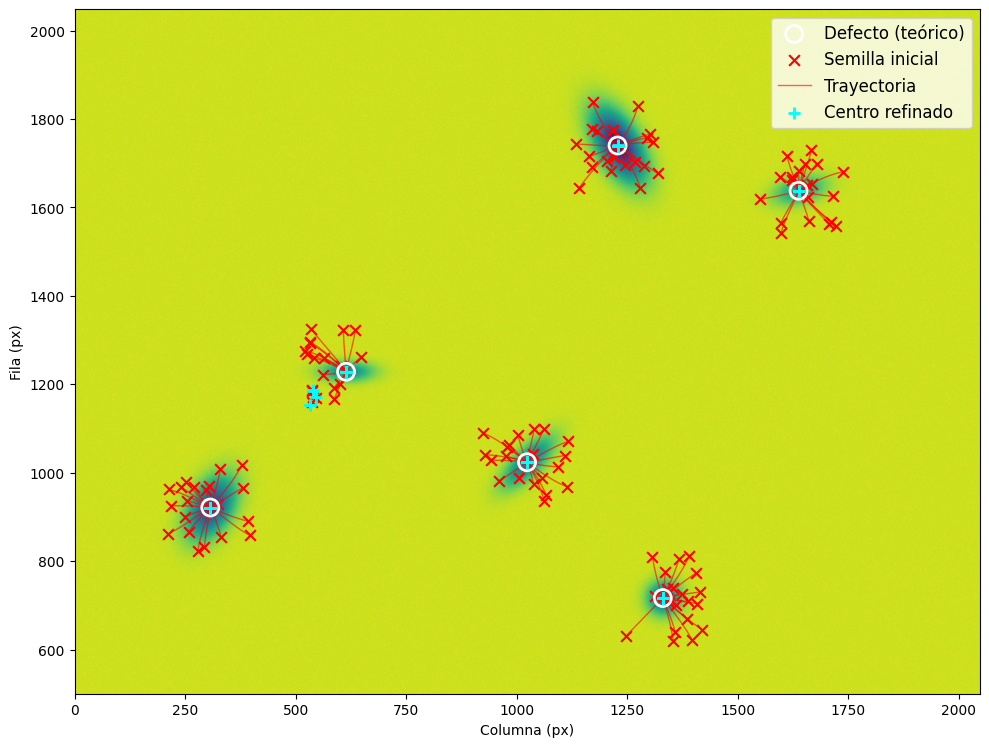

In [40]:
import numpy as np
import matplotlib.pyplot as plt

# — Suponemos que Z, coeffs, centers_real y refine_center_distance_based ya existen — 

# Parámetros
n_seeds   = 20
tol       = 1e-7
max_iter  = 200
alpha     = 0.1
beta      = 0.5
seed_disp = 100  # ±px

# Convertir centros reales a píxeles
H, W = Z.shape
centers_px = [real_to_pixel(x, y, W, H) for x, y in centers_real]

# Generar 10 semillas por defecto
np.random.seed(0)
all_seeds = []
for center in centers_px:
    i0, j0 = center
    seeds = [(i0 + np.random.uniform(-seed_disp, seed_disp),
              j0 + np.random.uniform(-seed_disp, seed_disp))
             for _ in range(n_seeds)]
    all_seeds.append(seeds)

# Refinar todas las semillas
all_trajectories = []
all_refined      = []
for seeds in all_seeds:
    trajs = []
    refs  = []
    for seed in seeds:
        refined, traj = refine_center_line_search(
            seed, coeffs,
            tol=tol,
            max_iter=max_iter,
            alpha=alpha,
            beta=beta
        )
        trajs.append(traj)
        refs.append(refined)
    all_trajectories.append(trajs)
    all_refined.append(refs)

plt.figure(figsize=(10, 10))
plt.imshow(Z, cmap='viridis', origin='lower', extent=[0, W, 0, H])
# plt.title("Trayectorias de refinamiento armijo para todos los defectos", fontsize=14)
plt.xlabel("Columna (px)")
plt.ylabel("Fila (px)")

# Usaremos los mismos colores para todos:
traj_color   = 'red'
seed_color   = 'red'
refine_color = 'cyan'
theo_color   = 'white'

for idx, (center, seeds, trajs, refs) in enumerate(zip(
        centers_px, all_seeds, all_trajectories, all_refined)):
    ci, cj = center
    
    # Marcar centro teórico
    plt.scatter(cj, ci,
                marker='o', facecolors='none',
                edgecolors=theo_color, s=150, linewidth=2,
                label=f'Defecto (teórico)' if idx == 0 else None,
                zorder=3)
    
    # Para cada semilla/trayectoria/refinado
    for seed, traj, ref in zip(seeds, trajs, refs):
        si, sj = seed
        ri, rj = ref
        
        # Semilla
        plt.scatter(sj, si,
                    marker='x', color=seed_color,
                    s=60, linewidth=1.5,
                    label='Semilla inicial' if idx == 0 else None,
                    zorder=2)
        
        # Trayectoria
        ti, tj = zip(*traj)
        plt.plot(tj, ti,
                 '-', color=traj_color, alpha=0.6, linewidth=1,
                 label='Trayectoria' if idx == 0 else None)
        
        # Refinado final
        plt.scatter(rj, ri,
                    marker='+', color=refine_color,
                    s=80, linewidth=2,
                    label='Centro refinado' if idx == 0 else None,
                    zorder=4)

# Un único legend
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys(), loc='upper right', fontsize=12)

plt.xlim(0, W)
plt.ylim(500, H)
plt.tight_layout()
plt.show()


Test con diferentes tamaños de ventana (naive)

,window_size,mean_deviation
0,51,116.527322
1,101,170.466088
2,151,222.558503
3,201,173.510828
4,251,212.582238
5,301,147.734919
6,351,91.253219
7,401,24.177450
8,451,25.690915
9,501,46.012741


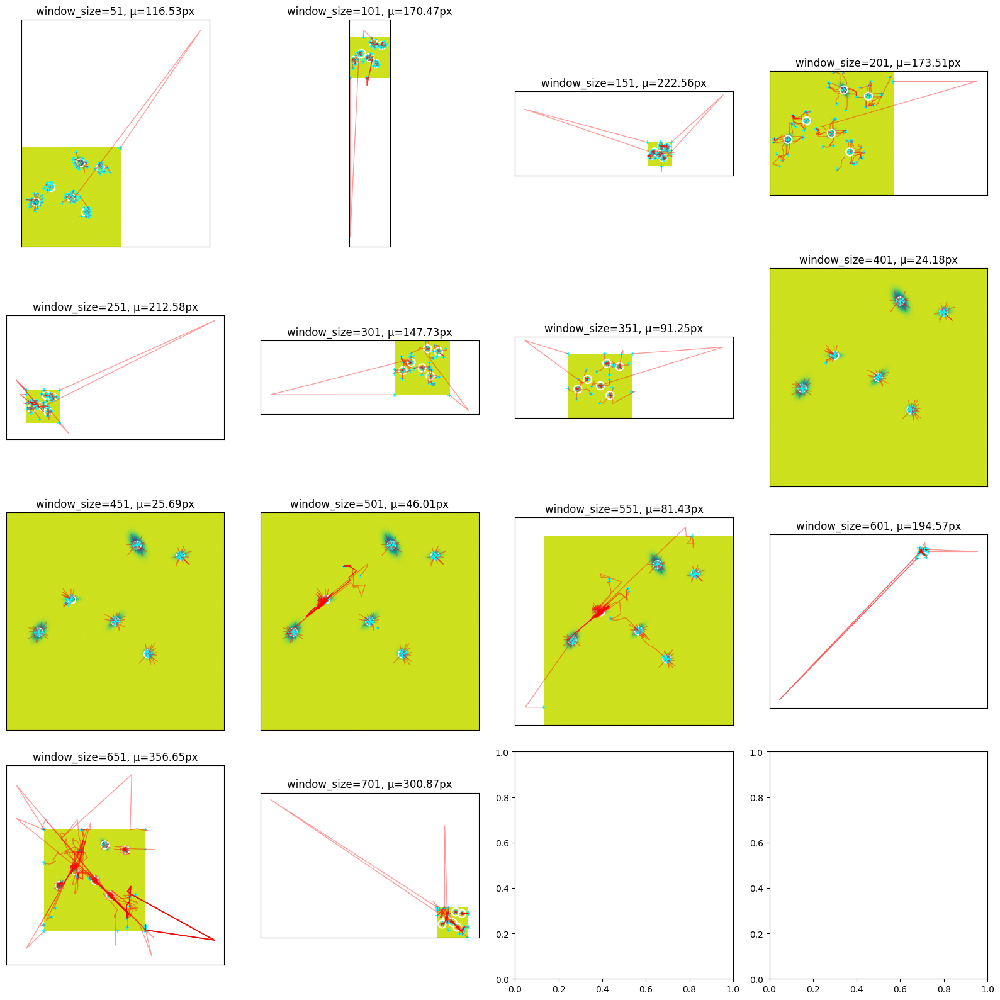

In [41]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import math


# — Asegúrate de tener definidas:
#    Z (HxW), real_to_pixel(), centers_real,
#    refine_center_distance_based(), sg2d_jacobian_projection_cv2()

# Parámetros
window_sizes = list(range(51, 702, 50))  # 51, 101, ..., 501
n_seeds      = 20
seed_disp    = 100   # ±100 px
tol          = 1.0
max_iter     = 200
alpha        = 0.1

# Dimensiones y centros teóricos en píxel
H, W = Z.shape
centers_px = [real_to_pixel(x, y, W, H) for x, y in centers_real]

# 1) Generar semillas (idénticas para cada ventana)
np.random.seed(0)
all_seeds = [
    [
        (i0 + np.random.uniform(-seed_disp, seed_disp),
         j0 + np.random.uniform(-seed_disp, seed_disp))
        for _ in range(n_seeds)
    ]
    for i0, j0 in centers_px
]

# 2) Configurar figura de subplots 2x5
n = len(window_sizes)
ncols = int(math.ceil(math.sqrt(n)))
nrows = int(math.ceil(n / ncols))
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 4, nrows * 4))
axes = axes.flatten()[:n]

# Tabla de resultados
results = []

for ax, w in zip(axes, window_sizes):
    # 2.1) Calcular coefs con ventana w
    coeffs_w = sg2d_jacobian_projection_cv2(Z, window_size=w)
    
    deviations = []
    refined_all = []
    trajs_all    = []
    
    # 2.2) Refinar cada semilla y recoger desviaciones y trayectorias
    for defect_idx, seeds in enumerate(all_seeds):
        true_i, true_j = centers_px[defect_idx]
        for seed in seeds:
            refined, traj = refine_center_distance_based(
                seed, coeffs_w,
                tol=tol, max_iter=max_iter, alpha=alpha
            )
            deviations.append(np.hypot(refined[0] - true_i,
                                       refined[1] - true_j))
            refined_all.append(refined)
            trajs_all.append(traj)
    
    mean_dev = np.mean(deviations)
    results.append({"window_size": w, "mean_deviation": mean_dev})
    
    # 2.3) Mostrar mapa y centros
    ax.imshow(Z, cmap='viridis', origin='lower', extent=[0, W, 0, H])
    ci, cj = zip(*centers_px)
    ax.scatter(cj, ci, marker='o', facecolors='none',
               edgecolors='white', s=80, lw=1.5)
    
    # Plotear trayectorias
    for traj in trajs_all:
        ti, tj = zip(*traj)
        ax.plot(tj, ti, '-', color='red', alpha=0.4, linewidth=1)
    # Plotear refinados
    ri, rj = zip(*refined_all)
    ax.scatter(rj, ri, marker='+', color='cyan', s=20, alpha=0.8)
    
    ax.set_title(f"window_size={w}, μ={mean_dev:.2f}px")
    ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout()

# 3) Mostrar tabla de desviaciones medias
df = pd.DataFrame(results)
display(df)


Test con diferentes tamaños de ventana (armijo)

,window_size,mean_deviation
0,101,130.719229
1,151,139.563937
2,201,126.294897
3,251,93.178268
4,301,41.477778
5,351,14.120967
6,401,4.281691
7,451,4.111864
8,501,8.908396
9,551,13.336155


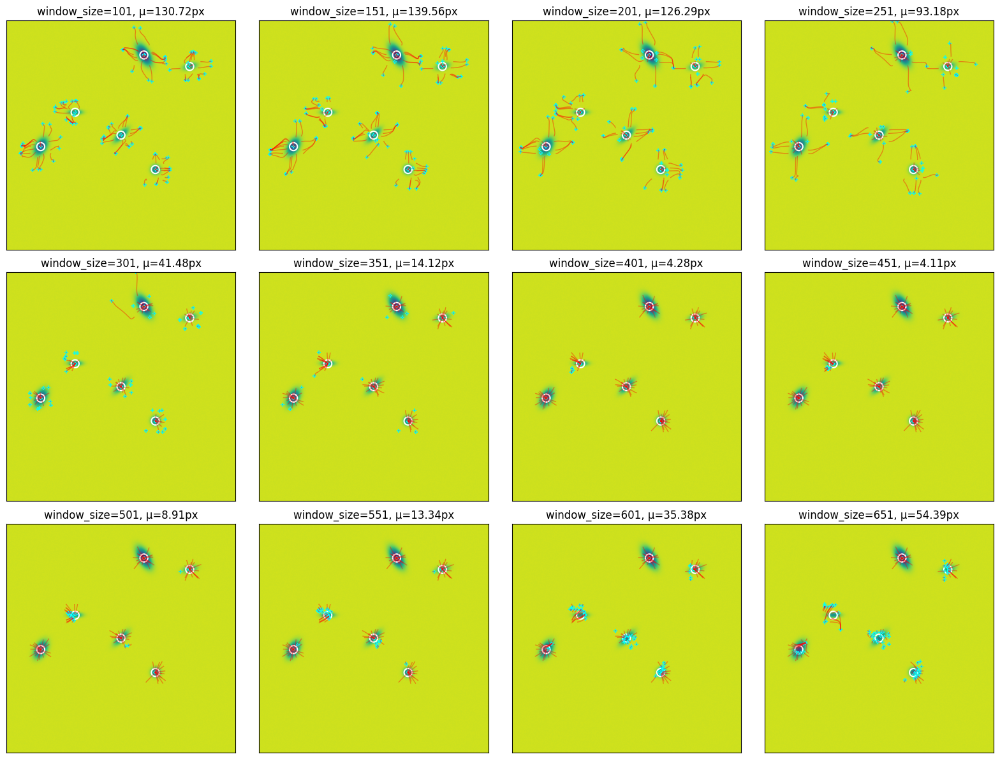

In [42]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import math


# — Asegúrate de tener definidas:
#    Z (HxW), real_to_pixel(), centers_real,
#    refine_center_distance_based(), sg2d_jacobian_projection_cv2()

# Parámetros
window_sizes = list(range(101, 652, 50))  # 51, 101, ..., 501
n_seeds   = 20
tol       = 1e-7
max_iter  = 200
alpha     = 0.1
beta      = 0.5
seed_disp = 100  # ±px


# Dimensiones y centros teóricos en píxel
H, W = Z.shape
centers_px = [real_to_pixel(x, y, W, H) for x, y in centers_real]

# 1) Generar semillas (idénticas para cada ventana)
np.random.seed(0)
all_seeds = [
    [
        (i0 + np.random.uniform(-seed_disp, seed_disp),
         j0 + np.random.uniform(-seed_disp, seed_disp))
        for _ in range(n_seeds)
    ]
    for i0, j0 in centers_px
]

# 2) Configurar figura de subplots 2x5
n = len(window_sizes)
ncols = int(math.ceil(math.sqrt(n)))
nrows = int(math.ceil(n / ncols))
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 4, nrows * 4))
axes = axes.flatten()[:n]

# Tabla de resultados
results = []

for ax, w in zip(axes, window_sizes):
    # 2.1) Calcular coefs con ventana w
    coeffs_w = sg2d_jacobian_projection_cv2(Z, window_size=w)
    
    deviations = []
    refined_all = []
    trajs_all    = []
    
    # 2.2) Refinar cada semilla y recoger desviaciones y trayectorias
    for defect_idx, seeds in enumerate(all_seeds):
        true_i, true_j = centers_px[defect_idx]
        for seed in seeds:
            refined, traj = refine_center_line_search(
                seed, coeffs_w,
                tol=tol,
                max_iter=max_iter,
                alpha=alpha,
                beta=beta
            )
            deviations.append(np.hypot(refined[0] - true_i,
                                       refined[1] - true_j))
            refined_all.append(refined)
            trajs_all.append(traj)
    
    mean_dev = np.mean(deviations)
    results.append({"window_size": w, "mean_deviation": mean_dev})
    
    # 2.3) Mostrar mapa y centros
    ax.imshow(Z, cmap='viridis', origin='lower', extent=[0, W, 0, H])
    ci, cj = zip(*centers_px)
    ax.scatter(cj, ci, marker='o', facecolors='none',
               edgecolors='white', s=80, lw=1.5)
    
    # Plotear trayectorias
    for traj in trajs_all:
        ti, tj = zip(*traj)
        ax.plot(tj, ti, '-', color='red', alpha=0.4, linewidth=1)
    # Plotear refinados
    ri, rj = zip(*refined_all)
    ax.scatter(rj, ri, marker='+', color='cyan', s=20, alpha=0.8)
    
    ax.set_title(f"window_size={w}, μ={mean_dev:.2f}px")
    ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout()

# 3) Mostrar tabla de desviaciones medias
df = pd.DataFrame(results)
display(df)


Para extender la curvatura parabólica en 1D a 2D, consideramos un paraboloide que aproxima el vértice de una función gaussiana. La matriz Hessiana, derivada de los mapas de curvatura a, b y c, nos lleva a una relación con los valores propios, que son las curvaturas principales del sistema. En el caso de una gaussiana, los valores propios en el centro se aproximan a $-(A)/(σ_i^2)$. Necesitamos derivar las aproximaciones de sigma, usando la relación $σ_i \approx \sqrt{-A/λ_i}$.

---

## 1. From 1D parabolic curvature to 2D paraboloids

In 2D, a smooth, symmetric bump or dent is often modeled as a **bivariate Gaussian** centered at $(x_0,y_0)$, with amplitudes $A$ and principal standard-deviations $\sigma_1,\sigma_2$, rotated by some angle $\theta$:

$$
f(x,y) \;=\; A \exp\!\Bigl(-\tfrac12 \bigl[\mathbf{u}^\top \Sigma^{-1}\mathbf{u}\bigr]\Bigr),
\quad
\mathbf{u}=\!
\begin{pmatrix}x - x_0\\ y - y_0\end{pmatrix},
\;\Sigma=R(\theta)\,\mathrm{diag}(\sigma_1^2,\sigma_2^2)\,R(\theta)^\top.
$$

Locally, within a small window around the peak, this is well-approximated by its **second-order Taylor** (a paraboloid):

$$
f(x,y)\approx 
a\,\Delta x^2 \;+\; b\,\Delta y^2 \;+\; c\,\Delta x\,\Delta y 
\;+\; d\,\Delta x \;+\; e\,\Delta y \;+\; f_0,
\quad \Delta x=x - x_0,\;\Delta y=y - y_0.
$$

From multivariable calculus, the **Hessian** of this quadratic form is

$$
H \;=\;
\begin{pmatrix}
\frac{\partial^2 f}{\partial x^2} & \frac{\partial^2 f}{\partial x\,\partial y}\\[4pt]
\frac{\partial^2 f}{\partial y\,\partial x} & \frac{\partial^2 f}{\partial y^2}
\end{pmatrix}
=
\begin{pmatrix}
2\,a & c \\[3pt]
c     & 2\,b
\end{pmatrix}.
$$

On the other hand, the **true** Hessian of the Gaussian at its center $(x_0,y_0)$ is

$$
\nabla^2 f\big|_{(x_0,y_0)} 
= -A\,\Sigma^{-1}
= -A\,R(\theta)\,\mathrm{diag}\bigl(\tfrac1{\sigma_1^2},\tfrac1{\sigma_2^2}\bigr)\,R(\theta)^\top.
$$

Hence the paraboloid’s Hessian $H$ must satisfy

$$
H \;\approx\; -\,A\,R(\theta)\,
\begin{pmatrix}1/\sigma_1^2 & 0\\[3pt]0 & 1/\sigma_2^2\end{pmatrix}\,
R(\theta)^\top.
$$

Equating eigen-decompositions gives:

* The **principal curvature** values are the eigenvalues of $H$:

  $$
    \lambda_1,\;\lambda_2
    \;=\;\text{eig}\bigl(H\bigr)
    \;\approx\;-\,\frac{A}{\sigma_1^2},\quad -\,\frac{A}{\sigma_2^2}.
  $$
* The corresponding **eigenvectors** give the bump’s orientation $\theta$.

Thus we immediately read off the widths:

$$
\sigma_i \;\approx\; \sqrt{\frac{A}{\lvert\lambda_i\rvert}}\,, 
\qquad i=1,2.
$$

Finally, the amplitude $A$ itself is recovered by evaluating the fitted quadratic at its vertex $\mathbf{v}$:

$$
\mathbf{v} = \begin{pmatrix}x_0\\y_0\end{pmatrix}
- \tfrac12\,H^{-1}\,\begin{pmatrix}d\\e\end{pmatrix},
\qquad
A \approx -\,f(\mathbf{v})
  = -\bigl[a\,\Delta x_v^2 + b\,\Delta y_v^2 + c\,\Delta x_v\,\Delta y_v + d\,\Delta x_v + e\,\Delta y_v + f_0\bigr].
$$



In [43]:
import numpy as np

def estimate_bump_parameters(centers, coeffs):
    """
    Estima para cada centro:
      - centro subpíxel (vi,vj)
      - A    (profundidad)
      - sigma1>=sigma2 (semiejes mayores y menores)
      - theta (orientación del eje mayor)
    utilizando Q = [[a, c/2],[c/2, b]] para extraer direcciones.
    """
    results = []
    for (i0, j0) in centers:
        ii, jj = int(round(i0)), int(round(j0))
        a, b, c, d, e, f0 = coeffs[ii, jj]

        # vértice Δ = -H^{-1}·grad  con H = [[2a, c],[c,2b]]
        H = np.array([[2*a, c],
                      [  c, 2*b]])
        grad = np.array([d, e])
        dx, dy = -np.linalg.solve(H, grad)
        vi, vj = ii + dy, jj + dx

        # amplitud en el vértice
        xv, yv = vj - jj, vi - ii
        A_est = - (a*xv**2 + b*yv**2 + c*xv*yv + d*xv + e*yv + f0)

        # matriz cuadrática Q para las direcciones
        Q = np.array([[   a,   c/2],
                      [c/2,      b]])
        eigvals, eigvecs = np.linalg.eigh(Q)

        # autovalores de Q miden curvaturas; los semiejes son proporcionales a sqrt(A/λ)
        widths = np.sqrt(np.abs(A_est / eigvals))

        # ordenar: sigma1 >= sigma2
        idx = np.argsort(widths)[::-1]
        sigma1, sigma2 = widths[idx[0]], widths[idx[1]]

        # vector propio del eje mayor
        principal_vec = eigvecs[:, idx[0]]
        # aseguramos una base de mano derecha
        if np.cross(eigvecs[:, idx[0]], eigvecs[:, idx[1]]) < 0:
            principal_vec = -principal_vec

        theta = np.arctan2(principal_vec[1], principal_vec[0])

        results.append({
            'center': (vi, vj),
            'A':       abs(A_est),
            'sigma1':  sigma1,
            'sigma2':  sigma2,
            'theta':   theta
        })
    return results


/tmp/ipykernel_313057/2958255758.py:43: DeprecationWarning: Arrays of 2-dimensional vectors are deprecated. Use arrays of 3-dimensional vectors instead. (deprecated in NumPy 2.0)
  if np.cross(eigvecs[:, idx[0]], eigvecs[:, idx[1]]) < 0:


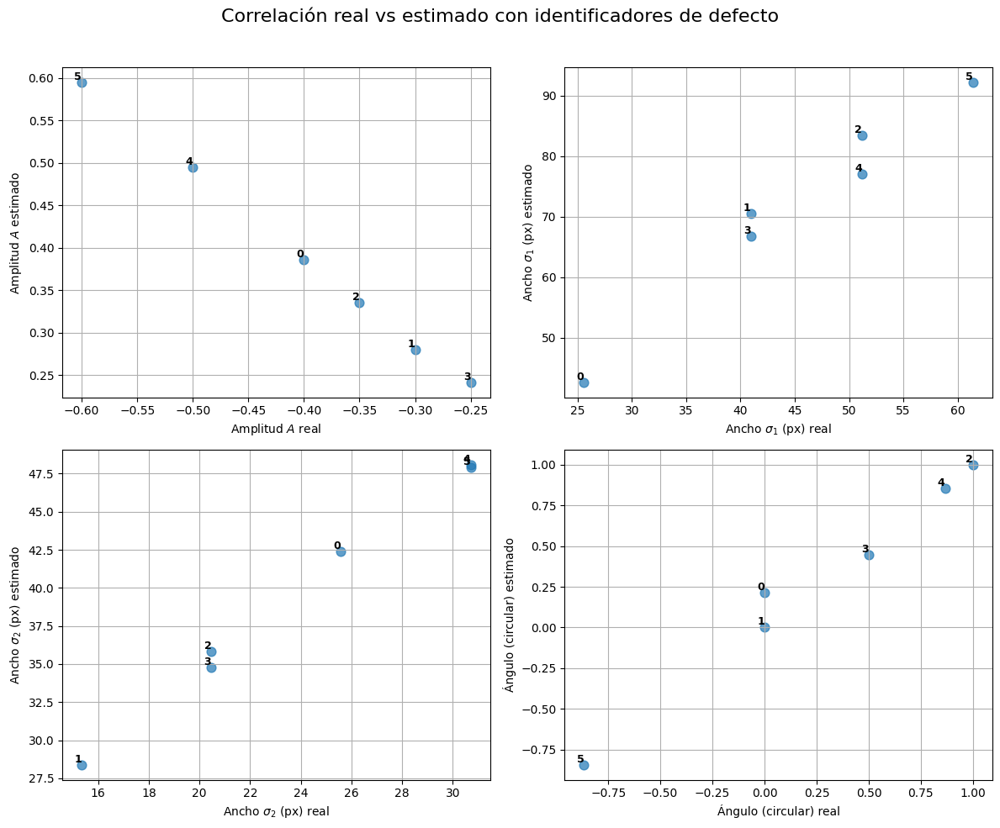

In [44]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Funciones de defectos (definir estas antes en tu entorno)
# add_gaussian(Z, xc, yc, sigma_x, sigma_y, amplitude)
# add_rotated_gaussian(Z, xc, yc, sigma_x, sigma_y, amplitude, angle_deg)
# real_to_pixel(x_real, y_real, W, H)
# sg2d_jacobian_projection_cv2(Z, window_size)
# estimate_bump_parameters(centers, coeffs)

# 1) Parámetros reales y creación de Z
N = 2048
x = np.linspace(-1, 1, N)
y = np.linspace(-1, 1, N)
X, Y = np.meshgrid(x, y)
Z = np.zeros_like(X)

real_params = [
    {'center': ( 0.3, -0.3), 'A': -0.4,  'sigma1': 0.025, 'sigma2': 0.025, 'theta':   0.0},
    {'center': (-0.4,  0.2), 'A': -0.3,  'sigma1': 0.04,  'sigma2': 0.015, 'theta':   0.0},
    {'center': ( 0.0,  0.0), 'A': -0.35, 'sigma1': 0.05,  'sigma2': 0.02,  'theta':  45.0},
    {'center': ( 0.6,  0.6), 'A': -0.25, 'sigma1': 0.04,  'sigma2': 0.02,  'theta':  15.0},
    {'center': (-0.7, -0.1), 'A': -0.50, 'sigma1': 0.05,  'sigma2': 0.03,  'theta':  60.0},
    {'center': ( 0.2,  0.7), 'A': -0.60, 'sigma1': 0.06,  'sigma2': 0.03,  'theta': 120.0},
]

for p in real_params:
    xc, yc = p['center']
    A = p['A']
    sx, sy = p['sigma1'], p['sigma2']
    theta = p['theta']
    if theta == 0:
        Z = add_gaussian(Z, xc, yc, sx, sy, A)
    else:
        Z = add_rotated_gaussian(Z, xc, yc, sx, sy, A, theta)

# Añadir ruido
np.random.seed(42)
Z += np.random.normal(0, 0.01, Z.shape)

# 2) Cálculo de coeficientes y estimación
coeffs = sg2d_jacobian_projection_cv2(Z, window_size=51)
centers_real = [p['center'] for p in real_params]
centers_px   = [real_to_pixel(x, y, N, N) for x, y in centers_real]
est_params   = estimate_bump_parameters(centers_px, coeffs)

# 3) Construir DataFrame para comparar
rows = []
for idx, (p_real, p_est) in enumerate(zip(real_params, est_params)):
    rows.append({
        'idx':          idx,
        'A_real':       p_real['A'],
        'A_est':        p_est['A'],
        'sigma1_real':  p_real['sigma1'] * ((N-1)/2),
        'sigma1_est':   p_est['sigma1'],
        'sigma2_real':  p_real['sigma2'] * ((N-1)/2),
        'sigma2_est':   p_est['sigma2'],
        'sin2θ_real':   np.sin(2*np.deg2rad(p_real['theta'])),
        'sin2θ_est':    np.sin(2*p_est['theta']),
    })
df = pd.DataFrame(rows)

# 4) Plots con identificadores
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = axes.flatten()
specs = [
    ('A_real','A_est',        'Amplitud $A$'),
    ('sigma1_real','sigma1_est', r'Ancho $\sigma_1$ (px)'),
    ('sigma2_real','sigma2_est', r'Ancho $\sigma_2$ (px)'),
    ('sin2θ_real','sin2θ_est','Ángulo (circular)')
]

for ax, (xcol, ycol, label) in zip(axes, specs):
    ax.scatter(df[xcol], df[ycol], s=60, alpha=0.7)
    for _, row in df.iterrows():
        ax.text(row[xcol], row[ycol], str(int(row['idx'])),
                fontsize=9, weight='bold', va='bottom', ha='right')
    ax.set_xlabel(f"{label} real")
    ax.set_ylabel(f"{label} estimado")
    ax.grid(True)

plt.suptitle("Correlación real vs estimado con identificadores de defecto", fontsize=16)
plt.tight_layout(rect=[0,0,1,0.96])
plt.show()



Más

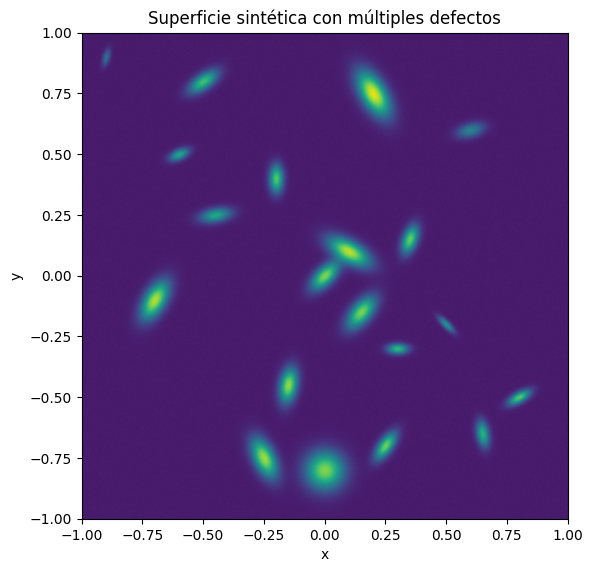

/tmp/ipykernel_313057/2958255758.py:43: DeprecationWarning: Arrays of 2-dimensional vectors are deprecated. Use arrays of 3-dimensional vectors instead. (deprecated in NumPy 2.0)
  if np.cross(eigvecs[:, idx[0]], eigvecs[:, idx[1]]) < 0:


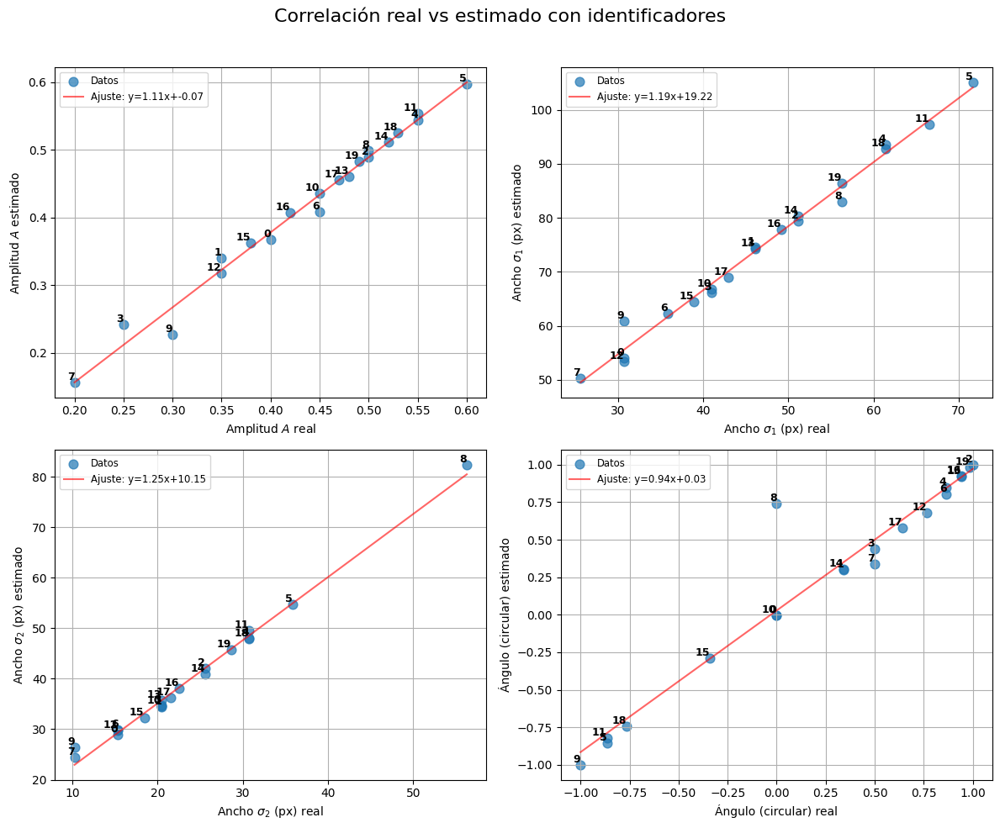

In [49]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# — Asegúrate de tener en el entorno:
#    add_gaussian, add_rotated_gaussian,
#    real_to_pixel, sg2d_jacobian_projection_cv2,
#    estimate_bump_parameters

# 1) Definición de la malla y fondo
N = 2048
x = np.linspace(-1, 1, N)
y = np.linspace(-1, 1, N)
X, Y = np.meshgrid(x, y)
Z = np.zeros_like(X)

# 2) Parámetros reales de cada defecto y construcción de Z
# sigma1 siempre ≥ sigma2 (semieje mayor), θ en grados
real_params = [
    {'center': ( 0.30, -0.30), 'A': 0.40, 'sigma1': 0.030, 'sigma2': 0.015, 'theta':   0.0},
    {'center': (-0.45,  0.25), 'A': 0.35, 'sigma1': 0.045, 'sigma2': 0.020, 'theta':  10.0},
    {'center': ( 0.00,  0.00), 'A': 0.50, 'sigma1': 0.050, 'sigma2': 0.025, 'theta':  45.0},
    {'center': ( 0.60,  0.60), 'A': 0.25, 'sigma1': 0.040, 'sigma2': 0.020, 'theta':  15.0},
    {'center': (-0.70, -0.10), 'A': 0.55, 'sigma1': 0.060, 'sigma2': 0.030, 'theta':  60.0},
    {'center': ( 0.20,  0.75), 'A': 0.60, 'sigma1': 0.070, 'sigma2': 0.035, 'theta': 120.0},
    {'center': ( 0.80, -0.50), 'A': 0.45, 'sigma1': 0.035, 'sigma2': 0.015, 'theta':  30.0},
    {'center': (-0.90,  0.90), 'A': 0.20, 'sigma1': 0.025, 'sigma2': 0.010, 'theta':  75.0},
    {'center': ( 0.00, -0.80), 'A': 0.50, 'sigma1': 0.055, 'sigma2': 0.055, 'theta':   0.0},
    {'center': ( 0.50, -0.20), 'A': 0.30, 'sigma1': 0.030, 'sigma2': 0.010, 'theta': 135.0},
    {'center': (-0.20,  0.40), 'A': 0.45, 'sigma1': 0.040, 'sigma2': 0.020, 'theta':  90.0},
    {'center': ( 0.10,  0.10), 'A': 0.55, 'sigma1': 0.065, 'sigma2': 0.030, 'theta': 150.0},
    {'center': (-0.60,  0.50), 'A': 0.35, 'sigma1': 0.030, 'sigma2': 0.015, 'theta':  25.0},
    {'center': ( 0.25, -0.70), 'A': 0.48, 'sigma1': 0.045, 'sigma2': 0.020, 'theta':  55.0},
    {'center': (-0.15, -0.45), 'A': 0.52, 'sigma1': 0.050, 'sigma2': 0.025, 'theta':  80.0},
    {'center': ( 0.65, -0.65), 'A': 0.38, 'sigma1': 0.038, 'sigma2': 0.018, 'theta': 100.0},
    {'center': (-0.50,  0.80), 'A': 0.42, 'sigma1': 0.048, 'sigma2': 0.022, 'theta':  35.0},
    {'center': ( 0.35,  0.15), 'A': 0.47, 'sigma1': 0.042, 'sigma2': 0.021, 'theta':  70.0},
    {'center': (-0.25, -0.75), 'A': 0.53, 'sigma1': 0.060, 'sigma2': 0.030, 'theta': 115.0},
    {'center': ( 0.15, -0.15), 'A': 0.49, 'sigma1': 0.055, 'sigma2': 0.028, 'theta':  50.0},
]



for p in real_params:
    xc, yc = p['center']
    A       = p['A']
    sx, sy  = p['sigma1'], p['sigma2']
    th      = p['theta']
    if th == 0:
        Z = add_gaussian(Z, xc, yc, sx, sy, A)
    else:
        Z = add_rotated_gaussian(Z, xc, yc, sx, sy, A, th)

# ruido
np.random.seed(42)
Z += np.random.normal(0, 0.01, Z.shape)

# 3) Mostrar la superficie sintética
plt.figure(figsize=(6,6))
plt.imshow(Z, cmap='viridis', origin='lower', extent=[-1,1,-1,1])
plt.title("Superficie sintética con múltiples defectos")
plt.xlabel("x"); plt.ylabel("y")
plt.tight_layout()
plt.show()

# 4) Cálculo de coeficientes SG y estimación de parámetros
coeffs     = sg2d_jacobian_projection_cv2(Z, window_size=51)
centers_px = [real_to_pixel(x, y, N, N) for x, y in [p['center'] for p in real_params]]
est_params = estimate_bump_parameters(centers_px, coeffs)

# 5) Comparativa en DataFrame y scatter plots
rows = []
for idx, (p_real, p_est) in enumerate(zip(real_params, est_params)):
    rows.append({
      'idx':           idx,
      'A_real':        p_real['A'],
      'A_est':         p_est['A'],
      'sigma1_real':   p_real['sigma1']*((N-1)/2),
      'sigma1_est':    p_est['sigma1'],
      'sigma2_real':   p_real['sigma2']*((N-1)/2),
      'sigma2_est':    p_est['sigma2'],
      'sin2θ_real':    np.sin(2*np.deg2rad(p_real['theta'])),
      'sin2θ_est':     np.sin(2*p_est['theta']),
    })
df = pd.DataFrame(rows)

fig, axes = plt.subplots(2,2,figsize=(12,10))
axes = axes.flatten()
specs = [
    ('A_real','A_est',        'Amplitud $A$'),
    ('sigma1_real','sigma1_est', r'Ancho $\sigma_1$ (px)'),
    ('sigma2_real','sigma2_est', r'Ancho $\sigma_2$ (px)'),
    ('sin2θ_real','sin2θ_est','Ángulo (circular)')
]
for ax,(xcol,ycol,label) in zip(axes,specs):
    # Scatter plot
    ax.scatter(df[xcol], df[ycol], s=60, alpha=0.7, label='Datos')
    
    # Etiquetas de puntos
    for _,row in df.iterrows():
        ax.text(row[xcol], row[ycol], str(int(row['idx'])),
                fontsize=9, weight='bold', va='bottom', ha='right')
    
    # Recta de ajuste (Regresión lineal)
    m, b = np.polyfit(df[xcol], df[ycol], 1)
    x_range = np.linspace(df[xcol].min(), df[xcol].max(), 100)
    ax.plot(x_range, m*x_range + b, 'r-', alpha=0.6, label=f'Ajuste: y={m:.2f}x+{b:.2f}')
    
    ax.set_xlabel(f"{label} real")
    ax.set_ylabel(f"{label} estimado")
    ax.grid(True)
    ax.legend(fontsize='small')

plt.suptitle("Correlación real vs estimado con identificadores", fontsize=16)
plt.tight_layout(rect=[0,0,1,0.96])
plt.show()


w=  5  ρ(A)=+0.9962  ρ(σ₁)=+0.1122  ρ(σ₂)=+0.2531  ρ(θ)=+0.5114
w= 11  ρ(A)=+0.9993  ρ(σ₁)=+0.2080  ρ(σ₂)=+0.8281  ρ(θ)=+0.6881
w= 21  ρ(A)=+0.9996  ρ(σ₁)=+0.9735  ρ(σ₂)=+0.9937  ρ(θ)=+0.9752
w= 31  ρ(A)=+0.9990  ρ(σ₁)=+0.9915  ρ(σ₂)=+0.9988  ρ(θ)=+0.9678
w= 41  ρ(A)=+0.9967  ρ(σ₁)=+0.9919  ρ(σ₂)=+0.9984  ρ(θ)=+0.9959
w= 51  ρ(A)=+0.9925  ρ(σ₁)=+0.9937  ρ(σ₂)=+0.9957  ρ(θ)=+0.9660
w= 61  ρ(A)=+0.9867  ρ(σ₁)=+0.9947  ρ(σ₂)=+0.9922  ρ(θ)=+0.9949
w= 71  ρ(A)=+0.9799  ρ(σ₁)=+0.9942  ρ(σ₂)=+0.9871  ρ(θ)=+0.9770
w= 81  ρ(A)=+0.9723  ρ(σ₁)=+0.9921  ρ(σ₂)=+0.9808  ρ(θ)=+0.9791
w= 91  ρ(A)=+0.9640  ρ(σ₁)=+0.9889  ρ(σ₂)=+0.9731  ρ(θ)=+0.9754
w=101  ρ(A)=+0.9554  ρ(σ₁)=+0.9855  ρ(σ₂)=+0.9636  ρ(θ)=+0.9846
w=111  ρ(A)=+0.9466  ρ(σ₁)=+0.9819  ρ(σ₂)=+0.9531  ρ(θ)=+0.9805
w=121  ρ(A)=+0.9378  ρ(σ₁)=+0.9783  ρ(σ₂)=+0.9404  ρ(θ)=+0.9665
w=131  ρ(A)=+0.9289  ρ(σ₁)=+0.9746  ρ(σ₂)=+0.9263  ρ(θ)=+0.9466
w=141  ρ(A)=+0.9202  ρ(σ₁)=+0.9702  ρ(σ₂)=+0.9098  ρ(θ)=+0.9592
w=151  ρ(A)=+0.9116  ρ(σ₁)=+0.9625  ρ(σ₂

,ρ(A),ρ(σ₁),ρ(σ₂),ρ(θ)
w,,,,
5,0.9962,0.1122,0.2531,0.5114
11,0.9993,0.2080,0.8281,0.6881
21,0.9996,0.9735,0.9937,0.9752
31,0.9990,0.9915,0.9988,0.9678
41,0.9967,0.9919,0.9984,0.9959
51,0.9925,0.9937,0.9957,0.9660
61,0.9867,0.9947,0.9922,0.9949
71,0.9799,0.9942,0.9871,0.9770
81,0.9723,0.9921,0.9808,0.9791


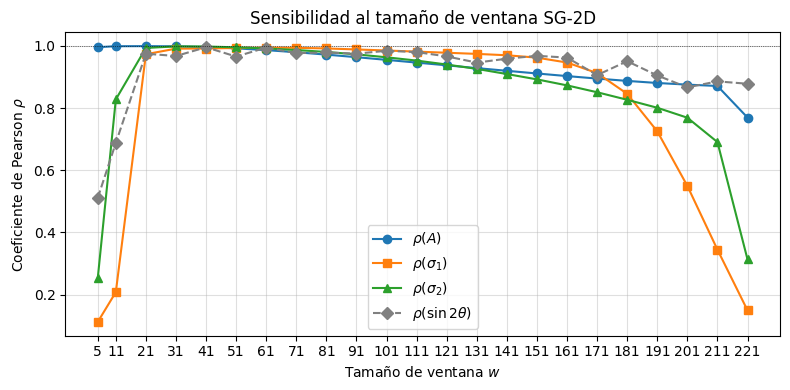

In [54]:
%matplotlib inline

# ── Análisis de sensibilidad al tamaño de ventana ──────────────────────────
import numpy as np
import pandas as pd
import warnings
from scipy.stats import pearsonr

# Tamaños de ventana a analizar
window_sizes_sens = [5, 11, 21, 31, 41, 51, 61, 71, 81, 91, 101, 111, 121, 131, 141, 151, 161, 171, 181, 191, 201, 211, 221]


# Centros teóricos en píxeles y valores reales en unidades de píxel
_centers_px = [real_to_pixel(p['center'][0], p['center'][1], N, N) for p in real_params]
_A_real  = np.array([p['A']                         for p in real_params])
_s1_real = np.array([p['sigma1'] * ((N - 1) / 2.0)  for p in real_params])
_s2_real = np.array([p['sigma2'] * ((N - 1) / 2.0)  for p in real_params])
_th_real = np.array([np.sin(2 * np.deg2rad(p['theta'])) for p in real_params])

# ── Bucle principal ──────────────────────────────────────────────────────────
sens_rows = []
for w in window_sizes_sens:
    coeffs_w = sg2d_jacobian_projection_cv2(Z, window_size=w)
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        est = estimate_bump_parameters(_centers_px, coeffs_w)

    _A_est  = np.array([e['A']      for e in est])
    _s1_est = np.array([e['sigma1'] for e in est])
    _s2_est = np.array([e['sigma2'] for e in est])
    _th_est = np.array([np.sin(2 * e['theta']) for e in est])

    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        rho_A,  _ = pearsonr(_A_real,  _A_est)
        rho_s1, _ = pearsonr(_s1_real, _s1_est)
        rho_s2, _ = pearsonr(_s2_real, _s2_est)
        rho_th, _ = pearsonr(_th_real, _th_est)

    sens_rows.append({'w': w, 'ρ(A)': round(rho_A,4), 'ρ(σ₁)': round(rho_s1,4),
                      'ρ(σ₂)': round(rho_s2,4), 'ρ(θ)': round(rho_th,4)})
    print(f"w={w:>3d}  ρ(A)={rho_A:+.4f}  ρ(σ₁)={rho_s1:+.4f}  ρ(σ₂)={rho_s2:+.4f}  ρ(θ)={rho_th:+.4f}")

df_sens = pd.DataFrame(sens_rows).set_index('w')
display(df_sens)


# ── Figura: correlación vs tamaño de ventana ────────────────────────────────
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(8, 4))
ws = df_sens.index.values
ax.plot(ws, df_sens['ρ(A)'],  'o-', label=r'$\rho(A)$')
ax.plot(ws, df_sens['ρ(σ₁)'], 's-', label=r'$\rho(\sigma_1)$')
ax.plot(ws, df_sens['ρ(σ₂)'], '^-', label=r'$\rho(\sigma_2)$')
ax.plot(ws, df_sens['ρ(θ)'],  'D--', color='gray', label=r'$\rho(\sin 2\theta)$')
ax.axhline(1.0, color='k', lw=0.5, ls=':')
ax.set_xlabel('Tamaño de ventana $w$')
ax.set_ylabel('Coeficiente de Pearson $\\rho$')
ax.set_title('Sensibilidad al tamaño de ventana SG-2D')
ax.set_xticks(ws)
ax.legend()
ax.grid(True, alpha=0.4)
plt.tight_layout()
plt.savefig('window_sensitivity_2d.png', dpi=150)
plt.show()

/tmp/ipykernel_313057/3248114379.py:109: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_class = plt.cm.get_cmap('tab10', 6)


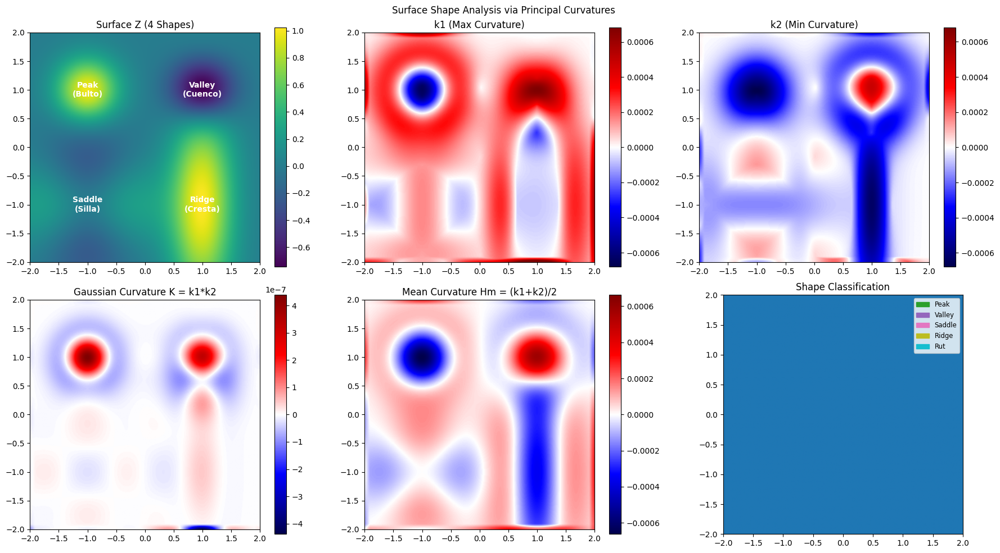

In [47]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# 1. Define Grid
N = 400
x = np.linspace(-2, 2, N)
y = np.linspace(-2, 2, N)
X, Y = np.meshgrid(x, y)
Z = np.zeros_like(X)

# 2. Add Shapes (Four Quadrants)
# Top-Left: Peak (Bulto) -> k1 < 0, k2 < 0
Z += 1.0 * np.exp(-((X + 1)**2 + (Y - 1)**2) / 0.3)

# Top-Right: Valley (Abolladura/Cuenco) -> k1 > 0, k2 > 0
Z -= 1.0 * np.exp(-((X - 1)**2 + (Y - 1)**2) / 0.3)

# Bottom-Left: Saddle (Silla) -> k1 * k2 < 0
# z ~ x^2 - y^2 (localized)
Z += 0.8 * ((X + 1)**2 - (Y + 1)**2) * np.exp(-((X + 1)**2 + (Y + 1)**2) / 0.8)

# Bottom-Right: Ridge (Cresta) -> One k << 0, One k ~ 0
Z += 1.0 * np.exp(-((X - 1)**2 + 0.1*(Y + 1)**2) / 0.3)

# 3. Compute Derivatives using Savitzky-Golay 2D
window_size = 21
coeffs = sg2d_jacobian_projection_cv2(Z, window_size=window_size)

# Extract coefficients: f(x,y) ~ ax^2 + by^2 + cxy + ...
a = coeffs[:, :, 0]
b = coeffs[:, :, 1]
c = coeffs[:, :, 2]

# 4. Compute Principal Curvatures (Eigenvalues of Hessian)
# Hessian H = [[2a, c], [c, 2b]]
# Trace = 2a + 2b
# Det = 4ab - c^2
# Eigenvalues = (Tr ± sqrt(Tr^2 - 4Det)) / 2
Tr = 2*a + 2*b
Det = 4*a*b - c**2
Gap = np.sqrt(np.maximum(0, Tr**2 - 4*Det))

k1 = (Tr + Gap) / 2  # Max curvature
k2 = (Tr - Gap) / 2  # Min curvature

# Gaussian and Mean Curvature
K = k1 * k2
Hm = (k1 + k2) / 2

# 5. Plotting
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# Surface
ax = axes[0, 0]
im = ax.imshow(Z, origin='lower', cmap='viridis', extent=[-2, 2, -2, 2])
ax.set_title("Surface Z (4 Shapes)")
ax.text(-1, 1, "Peak\n(Bulto)", color='white', ha='center', va='center', weight='bold')
ax.text(1, 1, "Valley\n(Cuenco)", color='white', ha='center', va='center', weight='bold')
ax.text(-1, -1, "Saddle\n(Silla)", color='white', ha='center', va='center', weight='bold')
ax.text(1, -1, "Ridge\n(Cresta)", color='white', ha='center', va='center', weight='bold')
fig.colorbar(im, ax=ax)

# k1
ax = axes[0, 1]
limit = np.max(np.abs(k1[window_size:-window_size, window_size:-window_size]))
im = ax.imshow(k1, origin='lower', cmap='seismic', vmin=-limit, vmax=limit, extent=[-2, 2, -2, 2])
ax.set_title("k1 (Max Curvature)")
fig.colorbar(im, ax=ax)

# k2
ax = axes[0, 2]
limit = np.max(np.abs(k2[window_size:-window_size, window_size:-window_size]))
im = ax.imshow(k2, origin='lower', cmap='seismic', vmin=-limit, vmax=limit, extent=[-2, 2, -2, 2])
ax.set_title("k2 (Min Curvature)")
fig.colorbar(im, ax=ax)

# Gaussian K
ax = axes[1, 0]
limit = np.max(np.abs(K[window_size:-window_size, window_size:-window_size]))
im = ax.imshow(K, origin='lower', cmap='seismic', vmin=-limit, vmax=limit, extent=[-2, 2, -2, 2])
ax.set_title("Gaussian Curvature K = k1*k2")
fig.colorbar(im, ax=ax)

# Mean Hm
ax = axes[1, 1]
limit = np.max(np.abs(Hm[window_size:-window_size, window_size:-window_size]))
im = ax.imshow(Hm, origin='lower', cmap='seismic', vmin=-limit, vmax=limit, extent=[-2, 2, -2, 2])
ax.set_title("Mean Curvature Hm = (k1+k2)/2")
fig.colorbar(im, ax=ax)

# Classification Logic
# Simple threshold-based classification for visualization
classification = np.zeros_like(Z)
t = 0.05 # Threshold

# 1: Peak (k1 < -t, k2 < -t)
classification[(k1 < -t) & (k2 < -t)] = 1
# 2: Valley (k1 > t, k2 > t)
classification[(k1 > t) & (k2 > t)] = 2
# 3: Saddle (k1 * k2 < -t^2)
classification[(k1 * k2 < -t**2)] = 3
# 4: Ridge (k2 < -t, |k1| < t) -- assuming k1 >= k2, so k2 is the negative one
classification[(k2 < -t) & (np.abs(k1) < t)] = 4
# 5: Rut/Valley (k1 > t, |k2| < t)
classification[(k1 > t) & (np.abs(k2) < t)] = 5

ax = axes[1, 2]
cmap_class = plt.cm.get_cmap('tab10', 6)
im = ax.imshow(classification, origin='lower', cmap=cmap_class, extent=[-2, 2, -2, 2], vmin=0, vmax=5)

# Legend
values = [1, 2, 3, 4, 5]
labels = ["Peak", "Valley", "Saddle", "Ridge", "Rut"]
colors = [cmap_class(i) for i in values]

patches = [mpatches.Patch(color=colors[i-1], label=labels[i-1]) for i in range(1, 6)]
ax.legend(handles=patches, loc='upper right', fontsize='small')
ax.set_title("Shape Classification")

plt.suptitle("Surface Shape Analysis via Principal Curvatures")
plt.tight_layout()
plt.show()

<>:114: SyntaxWarning: invalid escape sequence '\k'
<>:119: SyntaxWarning: invalid escape sequence '\k'
<>:114: SyntaxWarning: invalid escape sequence '\k'
<>:119: SyntaxWarning: invalid escape sequence '\k'
/tmp/ipykernel_313057/4180502997.py:114: SyntaxWarning: invalid escape sequence '\k'
  color='red', length=0.25, normalize=True, linewidth=1.5, label='Dir. Máx. Curvatura ($\kappa_1$)')
/tmp/ipykernel_313057/4180502997.py:119: SyntaxWarning: invalid escape sequence '\k'
  color='blue', length=0.25, normalize=True, linewidth=1.5, label='Dir. Mín. Curvatura ($\kappa_2$)')


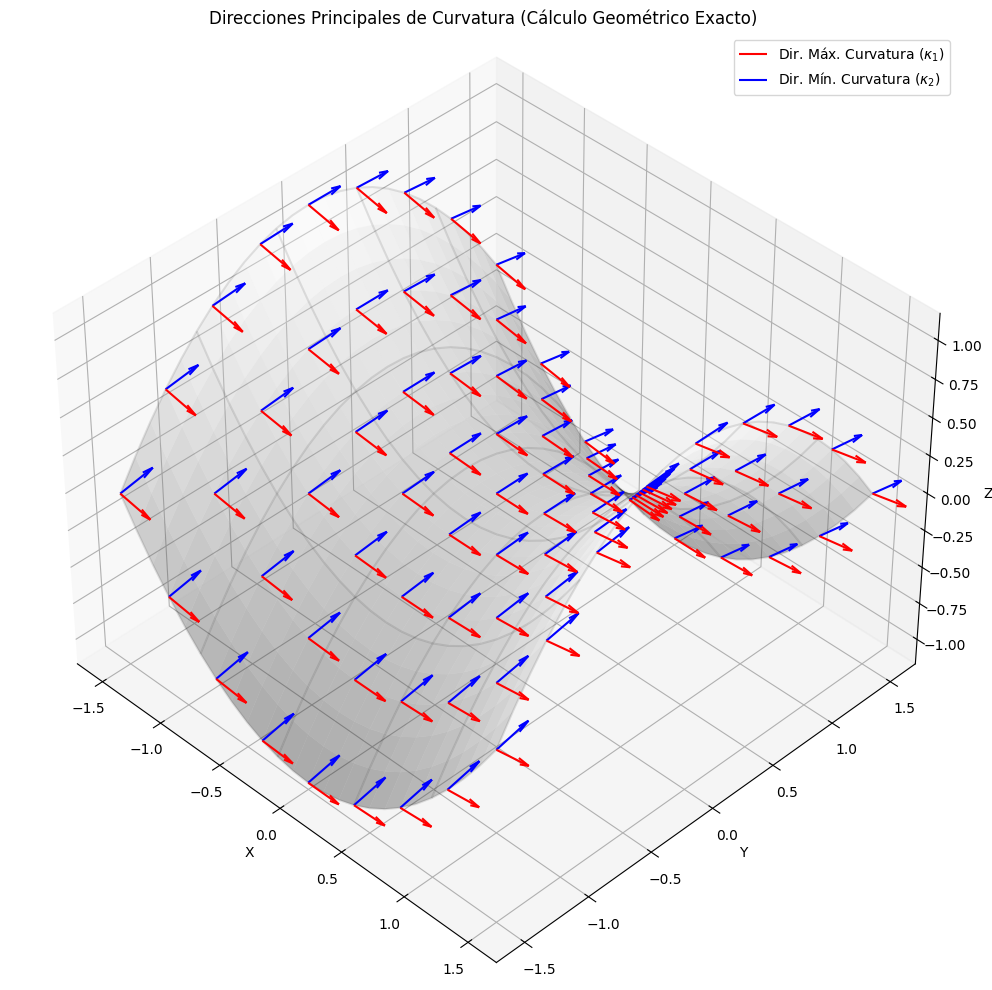

In [48]:
import numpy as np
import matplotlib.pyplot as plt

def compute_true_principal_directions(X, Y, Z):
    # 1. Calcular derivadas parciales (Gradiente)
    Zu, Zv = np.gradient(Z) # u es filas (Y), v es columnas (X) en numpy gradient por defecto si no se especifica axis
    # Pero para meshgrid, Z es (ny, nx). gradient devuelve [dZ/dy, dZ/dx]
    Zy, Zx = np.gradient(Z) 
    
    # 2. Calcular segundas derivadas
    Zxy, Zxx = np.gradient(Zx)
    Zyy, Zyx = np.gradient(Zy)
    
    rows, cols = Z.shape
    
    # Arrays para guardar los vectores 3D
    # Dir1: Curvatura Máxima (k1)
    U1, V1, W1 = np.zeros_like(Z), np.zeros_like(Z), np.zeros_like(Z)
    # Dir2: Curvatura Mínima (k2)
    U2, V2, W2 = np.zeros_like(Z), np.zeros_like(Z), np.zeros_like(Z)
    
    for i in range(rows):
        for j in range(cols):
            # Derivadas locales
            fx = Zx[i, j]
            fy = Zy[i, j]
            fxx = Zxx[i, j]
            fxy = Zxy[i, j]
            fyy = Zyy[i, j]
            
            # --- Geometría Diferencial ---
            # Primera Forma Fundamental (Métrica)
            E = 1 + fx**2
            F = fx * fy
            G = 1 + fy**2
            
            # Normalización para la Segunda Forma
            norm_n = np.sqrt(1 + fx**2 + fy**2)
            
            # Segunda Forma Fundamental
            L = fxx / norm_n
            M = fxy / norm_n
            N = fyy / norm_n
            
            # Matrices de las formas fundamentales
            I = np.array([[E, F], 
                          [F, G]])
            II = np.array([[L, M], 
                           [M, N]])
            
            # Operador de Weingarten (Shape Operator): W = I^(-1) * II
            # Sus autovectores son las direcciones principales en el plano de parámetros (xy)
            try:
                W = np.linalg.inv(I).dot(II)
                evals, evecs = np.linalg.eig(W)
            except np.linalg.LinAlgError:
                continue
                
            # Ordenar autovalores (k1 >= k2)
            idx = np.argsort(evals)[::-1]
            k1, k2 = evals[idx]
            
            # Direcciones en el plano XY (u, v)
            dir1_xy = evecs[:, idx[0]] # Vector asociado a k1
            dir2_xy = evecs[:, idx[1]] # Vector asociado a k2
            
            # --- Convertir a vectores 3D tangentes a la superficie ---
            # Vector tangente T = (du, dv, du*fx + dv*fy)
            
            # Vector 1 (Máxima curvatura)
            du1, dv1 = dir1_xy[0], dir1_xy[1] # Nota: x corresponde a col, y a row
            dz1 = du1 * fx + dv1 * fy
            vec1_3d = np.array([du1, dv1, dz1])
            vec1_3d /= np.linalg.norm(vec1_3d) # Normalizar
            
            # Vector 2 (Mínima curvatura)
            du2, dv2 = dir2_xy[0], dir2_xy[1]
            dz2 = du2 * fx + dv2 * fy
            vec2_3d = np.array([du2, dv2, dz2])
            vec2_3d /= np.linalg.norm(vec2_3d) # Normalizar
            
            # --- Corrección de signo para coherencia visual (opcional pero recomendado) ---
            # Forzamos que apunten "hacia afuera" del origen o tengan componente X positiva
            if vec1_3d[0] < 0: vec1_3d *= -1
            if vec2_3d[1] < 0: vec2_3d *= -1

            U1[i,j], V1[i,j], W1[i,j] = vec1_3d
            U2[i,j], V2[i,j], W2[i,j] = vec2_3d
            
    return (U1, V1, W1), (U2, V2, W2)

# 1. Crear superficie (Silla de montar)
x = np.linspace(-1.5, 1.5, 25)
y = np.linspace(-1.5, 1.5, 25)
X, Y = np.meshgrid(x, y)
Z = 0.5 * (X**2 - Y**2)

# 2. Calcular direcciones verdaderas
(U1, V1, W1), (U2, V2, W2) = compute_true_principal_directions(X, Y, Z)

# 3. Graficar
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')

# Superficie
surf = ax.plot_surface(X, Y, Z, cmap='gray', alpha=0.3, edgecolor='none')
ax.plot_wireframe(X, Y, Z, color='black', alpha=0.1, rstride=5, cstride=5)

# Vectores
step = 3
# Curvatura Máxima (Roja) - Debería seguir la parábola convexa (hacia arriba)
ax.quiver(X[::step, ::step], Y[::step, ::step], Z[::step, ::step], 
          U1[::step, ::step], V1[::step, ::step], W1[::step, ::step], 
          color='red', length=0.25, normalize=True, linewidth=1.5, label='Dir. Máx. Curvatura ($\kappa_1$)')

# Curvatura Mínima (Azul) - Debería seguir la parábola cóncava (hacia abajo)
ax.quiver(X[::step, ::step], Y[::step, ::step], Z[::step, ::step], 
          U2[::step, ::step], V2[::step, ::step], W2[::step, ::step], 
          color='blue', length=0.25, normalize=True, linewidth=1.5, label='Dir. Mín. Curvatura ($\kappa_2$)')

ax.set_title('Direcciones Principales de Curvatura (Cálculo Geométrico Exacto)')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.legend()
ax.view_init(elev=40, azim=-45)

plt.tight_layout()
plt.savefig('curvaturas_principales_correctas.png', dpi=300)
plt.show()